**Team ID**: 
4

**Team Name**: 
Pollutants trend in European Countries

**Members**:
Brocco Mattia, Businaro Stefano, Jasinskaite Evita, Pirovano Riccardo

* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

# POLLUTANTS AND RENEWABLE ENERGIES USE IN EUROPEAN UNION 

The aim of our research is to analyze the pollutant emissions coming from human activities in European Countries between 2009 and 2016 and how much they invested in renewable energies.

### Research questions
How much European countries were able to reduce the pollutants between 2009 and 2016?
Which effort has been made by each country?
Have they really invested on renewable energies?


### Datasets analyzed
In our research, we analyzed the following datasets available in Eurostat:
- Average CO2 emissions per km from new passenger cars
- Greenhouse emissions by source sector
- Consumption of inorganic fertilizers
- Bovine population
- Supply, transformation and consumption of renewable energies

We decided to analyze our data from two points of view:
- in terms of **actual values**, those that are in the datasets
- with **percentage normalization** starting from 2009 in order to consider the percentage variation of values.

### Countries analyzed
After we had cleaned all our datasets, we wrote the following code in order to individuate the countries that were common to all of them.

In this way we gathered five datasets with the same time interval (years between 2009 and 2016) and Countries.

```python
# STATES PER DATASET

# Greenhouse emissions by source sector
states_gess = []
for i in range(len(gess.index.values)):
    states_gess += [gess.index.values[i]]

# Average CO2 emissions per km from new passenger cars
states_cars = []
for i in range(len(cars_emissions.index.values)):
    states_cars += [cars_emissions.index.values[i]]  

# Consumption of inorganic fertilizers
states_infert = []
for i in range(len(inorganic_fert.index.values)):
    states_infert += [inorganic_fert.index.values[i]]

# Bovine population
states_bovine = []
for i in range(len(bovine_population.index.values)):
    states_bovine += [bovine_population.index.values[i]]
    
# Renewable energies
states_en = []
for i in range(len(ren_energy.index.values)):
    states_en += [ren_energy.index.values[i]]
    

# total states (with repetition)
states_tot = states_gess + states_cars + states_infert + states_bovine + states_en

# total states
states = []
for x in states_tot:
    if x not in states:
        states += [x]
        
print('Total number of states: ', len(states), end='\n\n')
print('Total states: ', sorted(states), sep='\n', end='\n\n')
print('---', end='\n\n')

# states that are in every database
common_states = []
for i in states:
    if i in common_states:
        continue
    if i in states_gess:
        if i in states_cars:
            if i in states_infert:
                if i in states_bovine:
                    if i in states_en:
                        common_states += [i]
                        
print('Number of states in all datasets: ', len(common_states), end='\n\n')
print('States in all datasets: ', sorted(common_states), sep='\n', end='\n\n')
print('---', end='\n\n')

# states excluded
non_common = []
for n in states:
    if n not in common_states:
        non_common += [n]
        
print('Number of states NOT in all datasets: ', len(non_common), end='\n\n')
print('States NOT in all datasets: ', sorted(non_common), sep='\n')
```

As a result, these are countries involved in the research:
 - Austria
 - Belgium
 - Czechia
 - Denmark
 - Estonia
 - Finland
 - France
 - Germany
 - Greece
 - Hungary
 - Ireland
 - Italy
 - Latvia
 - Lithuania
 - Luxembourg
 - Netherlands
 - Poland
 - Portugal
 - Slovakia
 - Slovenia
 - Spain
 - Sweden
 - United Kingdom

In [1]:
# list of our countries 
common_states = ['Austria', 'Belgium', 'Czechia', 'Denmark', 'Estonia','Finland',
                 'France', 'Germany', 'Greece', 'Hungary','Ireland', 'Italy',
                 'Latvia', 'Lithuania', 'Luxembourg', 'Netherlands', 'Poland', 'Portugal',
                 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'United Kingdom']

# Datasets
First we must `import` and `install` all the built-in libraries and libraries we created that we needed for our project.
Then for each dataset separately we proposed data cleaning, visualization and a comment.

In [2]:
!pip install pillow
!pip install folium

In [3]:
import os
import os.path
import pandas as pd
import numpy as np 
import json
import folium
import base64
%matplotlib notebook
import matplotlib.pyplot as plt
from pylab import *

# Classes
import PLOTS_class as pc
import GEO_class as gc
import DATA_MANAGER_class as dm

os.getcwd()

'C:\\Users\\Mattia Brocco\\Desktop\\GROUP 4 Project'

* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

## Average CO2 emissions per km from new passenger cars
The dataset is an indicator defined as the average carbon dioxide emissions per km by new passengers in a given year and it monitors the progress towards the different SDG ‘s (sustainable development goals) and the manufacturer ’s overall fleet. The target set by the EU in the Climate Action was a limit of 130 grams of CO2 per km for new cars by 2015 and 95 grams of CO2 per km in 2021.


### Cleaned and normalized dataframes

In [4]:
# CLEANED DATASET

cars_emissions = pd.read_csv('Average CO2 emissions per km from new passenger cars.csv')

# taking years between 2009, 2016
for i in range(0,9):
    year = str(2000 + i)
    cars_emissions.drop(year, axis = 1, inplace = True)   
cars_emissions.drop('2017', axis = 1, inplace = True)

# dropping values we do not need
cars_emissions = cars_emissions.replace(':', np.nan)
cars_emissions = cars_emissions.dropna()
cars_emissions = cars_emissions.drop(cars_emissions.index[30:])
cars_emissions = cars_emissions.drop(cars_emissions.index[:2])

# rename geo\time column
cars_emissions = cars_emissions.rename(columns={"geo\\time": "GEO"}) 

# sorted index
cars_emissions.set_index("GEO", inplace=True)

# While we were cleaning our df we noticed that in this file did not appear Belgium even if in the others it did
# Therefore, we add Belgium copypasting values (that are present in the original file!)
cars_emissions.loc["Belgium"] = [142.1,133.4,127.2,128,124,121.3,117.9,115.9]

# sorting by country 
cars_emissions = cars_emissions.sort_values(by=["GEO"], axis=0, ascending=True) 

# only common states
states = gc.geo()
states.common_states(cars_emissions)

# convert values to floats since they are strings
nv = dm.data_manager()
nv.floats_2(cars_emissions)

# adding the mean of all our values - EU (23 Countries)
EU = gc.geo()
EU.EU_mean(cars_emissions)
for i in range(len(cars_emissions.values[23])):
    cars_emissions.values[23][i] = np.round(cars_emissions.values[23][i],1)

# convert years (names of columns) to integers to have them the same in all df
cars_emissions.columns = pd.to_numeric(cars_emissions.columns)

cars_emissions

,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Austria,150.2,144,138.7,135.7,131.6,128.5,123.7,120.4
Belgium,142.1,133.4,127.2,128,124,121.3,117.9,115.9
Czechia,155.5,148.9,144.5,140.8,134.6,131.6,126.3,121.2
Denmark,139.1,126.2,125,117,112.7,110.2,106.2,106
Estonia,170.3,162,156.9,150.3,147,140.9,137.2,133.9
Finland,157,149,144,139.1,131.8,127.4,123,120
France,133.5,130.5,127.7,124.4,117.4,114.2,111,109.8
Germany,154,151.1,145.6,141.6,136.1,132.5,128.3,126.9
Greece,157.4,143.7,132.7,121.1,111.9,108.2,106.4,106.3


In [5]:
# NORMALIZED DATASET
cars_emissions_100 = cars_emissions.copy()

# 2009 as base of 100
b2009 = dm.data_manager()
b2009.norm(cars_emissions_100)

# only one decimal 
cars_emissions_100 = cars_emissions_100.replace(100,100.0)
values_dec = dm.data_manager()
values_dec.one_decimal(cars_emissions_100)

cars_emissions_100

,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Austria,100.0,95.9,92.3,90.3,87.6,85.6,82.4,80.2
Belgium,100.0,93.9,89.5,90.1,87.3,85.4,83.0,81.6
Czechia,100.0,95.8,92.9,90.5,86.6,84.6,81.2,77.9
Denmark,100.0,90.7,89.9,84.1,81.0,79.2,76.3,76.2
Estonia,100.0,95.1,92.1,88.3,86.3,82.7,80.6,78.6
Finland,100.0,94.9,91.7,88.6,83.9,81.1,78.3,76.4
France,100.0,97.8,95.7,93.2,87.9,85.5,83.1,82.2
Germany,100.0,98.1,94.5,91.9,88.4,86.0,83.3,82.4
Greece,100.0,91.3,84.3,76.9,71.1,68.7,67.6,67.5


### Visualization

To visualize the Choropleth map we need to create a new dataframe that has GEO values (the index of the original dataset) as columns, and the mean of each Country between 2009 and 2016 so that we can comprehend which polluted the most in those years.

In [6]:
# load df
cars_emissionswithindex = cars_emissions.reset_index()

# adding the column "Mean" with 0 values 
cars_emissionswithindex["Mean"] = 0
# filling the column with the correct values
for i in range(len(cars_emissionswithindex.values)):
    mean = 0
    for t in range(1,9):
        mean += cars_emissionswithindex.values[i][t]
    mean /= 8
    cars_emissionswithindex["Mean"][i] = mean

# PlOT THE CHOROPLETH FROM THE PLOTS_class
cars_map = pc.graph()
cars_map.choropleth(cars_emissionswithindex, "Average cars emissions (2009-2016)", "Mean", "YlOrBr")


C:\Users\Mattia Brocco\Anaconda\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':
C:\Users\Mattia Brocco\Anaconda\lib\site-packages\folium\folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


#### Brief conclusion:

In [7]:
# Code to see which countries have reached the target put by EU for 2015

best_cars = cars_emissions.copy()
best_cars["Target"] = None
for i in range(len(best_cars[2015])):
    if best_cars[2015][i] > 130:
        best_cars["Target"][i] = "No"
    else:
        best_cars["Target"][i] = "Yes"
            
best_cars

,2009,2010,2011,2012,2013,2014,2015,2016,Target
GEO,,,,,,,,,
Austria,150.2,144,138.7,135.7,131.6,128.5,123.7,120.4,Yes
Belgium,142.1,133.4,127.2,128,124,121.3,117.9,115.9,Yes
Czechia,155.5,148.9,144.5,140.8,134.6,131.6,126.3,121.2,Yes
Denmark,139.1,126.2,125,117,112.7,110.2,106.2,106,Yes
Estonia,170.3,162,156.9,150.3,147,140.9,137.2,133.9,No
Finland,157,149,144,139.1,131.8,127.4,123,120,Yes
France,133.5,130.5,127.7,124.4,117.4,114.2,111,109.8,Yes
Germany,154,151.1,145.6,141.6,136.1,132.5,128.3,126.9,Yes
Greece,157.4,143.7,132.7,121.1,111.9,108.2,106.4,106.3,Yes


The target set by the EU was a limit of 130 grams of CO2 per km for new cars by 2015 and 95 grams of CO2 per km in 2021. 

As we can see from the above table, for what concerns reaching the target in 2015, Latvia and Estonia failed, while all other countries succeeded in it.
In 2016 all countries, except for Estonia, reached the target. 

Moreover, from the table with normalized values, we can notice how all Countries have decreased emissions from cars over years and thanks to the graph and the first table we easily understand how Denmark, France, Portugal and Netherlands have been the countries that emitted the least.

1. Estonia and Latvia did not achieve to lower the emissions for new passenger cars below the 130 g threshold of CO2/km.
2. All the Countries lowered this parameter from 2009 to 2015.
3. The only Country that after 2015 increased this parameter was Netherlands.
4. Italy has been in the top five for the first two years, then it has always been in the first ten countries.

* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

## Greenhouse gas emissions by source sector
The dataset contains emission data expressed in tons of all the greenhouse gasses emissions coming from the source sectors (Agriculture, Industrial processes and product use, Energy, LULUCF, Waste management and other sectors).

### Cleaned and normalized dataframes

In [8]:
# CLEANED DATASET

gess = pd.read_csv("Greenhouse gas emissions by source sector.csv")

# drop rows we will not use
gess.drop(gess[gess.AIRPOL != "Greenhouse gases (CO2, N2O in CO2 equivalent, CH4 in CO2 equivalent, HFC in CO2 equivalent, PFC in CO2 equivalent, SF6 in CO2 equivalent, NF3 in CO2 equivalent)"].index, inplace = True)
gess.drop(gess[gess.AIREMSECT != "All sectors (excluding memo items)"].index, inplace = True)

# drop columns
gess.drop(["UNIT","AIRPOL","AIREMSECT","Flag and Footnotes","Unnamed: 7"], axis=1, inplace=True)

# reindexed rows and drop old indexes
gess = gess.reset_index() 
gess.drop("index", axis=1, inplace=True)

# convert values to floats
nv = dm.data_manager()
nv.floats_1(gess)

# create a more-readable pivot table
gess = gess.pivot_table(index = ["GEO"], columns = ["TIME"], values="Value", aggfunc='sum')

# rename Germany
gess.rename(index={"Germany (until 1990 former territory of the FRG)": "Germany"}, inplace=True) 

# only common states
st = gc.geo()
st.common_states(gess)

# taking years between 2009, 2016
for i in range(7,9):
    year = 2000 + i
    gess.drop(year, axis = 1, inplace = True) 

# add EU
eu = gc.geo()
eu.add_EU(gess)

gess

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Austria,75574.35,79052.88,76344.00,74441.28,75653.69,71716.10,74410.36,75464.20
Belgium,123628.82,131175.85,120745.69,118189.81,118481.29,112808.66,116402.19,116577.58
Czechia,129293.42,133569.91,130300.47,126406.68,122124.44,120260.20,121088.50,124246.14
Denmark,64597.56,62082.65,55336.87,52874.25,56031.01,50968.76,52421.27,55604.61
Estonia,13782.27,19144.56,19037.05,18035.71,20339.65,19400.53,15793.20,16902.60
Finland,29507.07,47930.42,38730.20,29547.17,35738.64,27990.76,26589.00,31680.26
France,458741.14,474002.77,450247.96,444205.27,442026.68,411738.97,417230.51,421586.52
Germany,890154.29,926414.47,904571.69,910152.46,927716.94,887784.99,892376.33,894925.32
Greece,121434.01,115325.27,112260.90,108996.12,100923.38,98957.33,91618.34,88298.58


In [9]:
# NORMALIZED DATASET
gess_100 = gess.copy()

# 2009 as base of 100
b2009 = dm.data_manager()
b2009.norm(gess_100)

# only one decimal 
values_dec = dm.data_manager()
values_dec.one_decimal(gess_100)

gess_100

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Austria,100.0,104.6,101.0,98.5,100.1,94.9,98.5,99.9
Belgium,100.0,106.1,97.7,95.6,95.8,91.2,94.2,94.3
Czechia,100.0,103.3,100.8,97.8,94.5,93.0,93.7,96.1
Denmark,100.0,96.1,85.7,81.9,86.7,78.9,81.2,86.1
Estonia,100.0,138.9,138.1,130.9,147.6,140.8,114.6,122.6
Finland,100.0,162.4,131.3,100.1,121.1,94.9,90.1,107.4
France,100.0,103.3,98.1,96.8,96.4,89.8,91.0,91.9
Germany,100.0,104.1,101.6,102.2,104.2,99.7,100.2,100.5
Greece,100.0,95.0,92.4,89.8,83.1,81.5,75.4,72.7


### Visualization

This graph shows how much the country polluted during all the years. Bigger the icon, higher the emissions by source sector (considering the sum of all years due to the **stock effect of pollution**).
To plot the graph we are referring to the class PLOTS_class; the parameters needed for the function are the icon in .png extension, the dataframe, and the number to divide values by.

In [40]:
gessmap = pc.graph()
gessmap.icon_map("industry.png", gess, 60000)

The second graph is a Choropleth that shows the difference between 2016 and 2009 in order to additionally understand which countries are not making enough effort to reduce emissions in their production system.

In [11]:
# load df
gess_index = gess_100.reset_index()

# adding the column "Progress" that will measure the difference (in percentage) between 2016 and 2009 
gess_index["Progress"] = 0
progress = 0
for i in range(len(gess_index[2009])):
    progress = gess_index[2016][i] - gess_index[2009][i]
    gess_index["Progress"][i] = progress
    progress = 0

# choropleth from PLOTS_class
gess_map = pc.graph()
gess_map.choropleth(gess_index,
                    "Percentage change of Greenhouse gas emissions by source sector between 2016 and 2009",
                    "Progress","BuPu")

C:\Users\Mattia Brocco\Anaconda\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


#### Brief conclusion:

In [12]:
gess.sort_values(2016, ascending=False).head(6)

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
EU (23 Countries),4146193.25,4265196.61,4103486.44,4052522.60,3970582.85,3799118.18,3823186.45,3819335.07
Germany,890154.29,926414.47,904571.69,910152.46,927716.94,887784.99,892376.33,894925.32
United Kingdom,584139.80,597410.36,549425.24,568349.93,552757.02,511211.76,492795.07,468290.48
France,458741.14,474002.77,450247.96,444205.27,442026.68,411738.97,417230.51,421586.52
Italy,469749.06,473349.18,466328.89,453846.14,408291.34,391851.77,397552.11,397935.13
Poland,356174.88,375577.32,368174.24,361497.71,355934.59,351684.06,357940.65,367871.72


In [13]:
gess_100.sort_values(2016, ascending=False).head(6)

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Latvia,100.0,140.6,128.4,98.5,105.7,159.7,153.4,132.2
Estonia,100.0,138.9,138.1,130.9,147.6,140.8,114.6,122.6
Finland,100.0,162.4,131.3,100.1,121.1,94.9,90.1,107.4
Poland,100.0,105.4,103.4,101.5,99.9,98.7,100.5,103.3
Portugal,100.0,97.6,95.5,96.5,94.6,91.7,100.8,102.9
Ireland,100.0,101.1,94.7,96.7,95.8,95.5,98.4,101.5


In [14]:
gess_100.sort_values(2016, ascending=True).head(5)

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Sweden,100.0,109.7,127.0,77.2,95.1,75.3,49.3,55.1
Greece,100.0,95.0,92.4,89.8,83.1,81.5,75.4,72.7
United Kingdom,100.0,102.3,94.1,97.3,94.6,87.5,84.4,80.2
Lithuania,100.0,82.4,87.6,91.1,87.3,95.8,98.5,81.7
Italy,100.0,100.8,99.3,96.6,86.9,83.4,84.6,84.7


Looking to the tables and to the graphs, we immediately get how Countries that have produced more emissions during this range of time are not the same of those countries that in 2016 polluted more than in 2009, except for Poland which is in the "top 5" in both cases.

Indeed, the Country with more emissions is Germany followed by United Kingdom, France, Italy and Poland. However, from these 5 more-polluting countries we get that two of them, UK and Italy, are the two of the best countries in terms of reducing activities from the beginning of our analysis (2009) to 2016, as they decreased emissions respectively by 19.8% and 15.3%

Among the mentioned countries France decreased its emissions by 8.1%, while on the contrary Germany increased it a little.
Estonia (+22.6%) and Latvia (+32.2%) increased a lot their emissions through the years, even if in terms of absolute values, they are at the bottom of the list.

The greatest news is given by Sweden which decreased its emissions by almost 50%, better than all the other countries. In fact, in 2016 its emissions are lower than in any other country. Greece also made a great job decreasing emissions by 27.3%. We can also observe that Finland increased a lot in 2010, 2011 and 2013, then it began to reduce its emissions, but in 2016 it again increased them, showing its up-and-downs course.

* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

## Consumption of inorganic fertilizers
The dataset reports the tons of nitrogen and phosphorus released in the atmosphere by the use of inorganic fertilizers. Inorganic fertilizers are a plague for pollutions since they release in both the ground and the air P (phosphorus) and P2O5 (phosphoric anhydride) which are dangerous water pollutants.

### Cleaned and normalized dataframes

In [15]:
# CLEANED DATASET

inorganic_fert = pd.read_csv('Consumption of inorganic fertilizers.csv')

# changing the values as floats 
nv = dm.data_manager()
nv.floats_1(inorganic_fert)
    
# drop unneccesary columns
inorganic_fert.drop(['Flag and Footnotes','UNIT'], axis = 1, inplace = True)
inorganic_fert.drop(inorganic_fert[inorganic_fert.GEO == 'European Union (EU6-1958, EU9-1973, EU10-1981, EU12-1986, EU15-1995, EU25-2004, EU27-2007, EU28-2013, EU27-2019)'].index, inplace=True)
inorganic_fert.drop(inorganic_fert[inorganic_fert.GEO == 'European Union - 28 countries'].index, inplace=True)

# create a more-readable pivot table
inorganic_fert = inorganic_fert.pivot_table(index=['GEO'], columns=['TIME'], values='Value', aggfunc='sum')

# rename germany
inorganic_fert.rename(index={"Germany (until 1990 former territory of the FRG)": "Germany"}, inplace=True) 

# drop 2008, 2017
inorganic_fert.drop(columns={2008,2017}, inplace= True)

# only common states
states = gc.geo()
states.common_states(inorganic_fert)

# add the sum of all our values - EU (23 Countries)
EU = gc.geo()
EU.add_EU(inorganic_fert)        
        
inorganic_fert

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Austria,96388,117289,108108,120196,124860,135672,138381,147482
Belgium,152012,156941,148267,147561,154516,156753,158907,160907
Czechia,261344,283910,370049,367721,349817,345737,418357,427900
Denmark,211412,200072,207162,199800,205900,200800,219100,211000
Estonia,29799,31299,32483,35933,36788,39581,39798,39834
Finland,146793,169122,157235,149500,149320,159218,154462,147956
France,2227943,2257358,2550818,2214562,2361005,2397728,2395222,2412908
Germany,1626747,1671720,1911510,1748294,1772901,1799288,1954294,1836259
Greece,208791,243021,206442,197179,208530,189966,186296,207534


In [16]:
# NORMALIZED DATASET
inorganic_fert_100 = inorganic_fert.copy()

# 2009 as base of 100
b2009 = dm.data_manager()
b2009.norm(inorganic_fert_100)

# only one decimal 
values_dec = dm.data_manager()
values_dec.one_decimal(inorganic_fert_100)

inorganic_fert_100

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Austria,100.0,121.7,112.2,124.7,129.5,140.8,143.6,153.0
Belgium,100.0,103.2,97.5,97.1,101.6,103.1,104.5,105.9
Czechia,100.0,108.6,141.6,140.7,133.9,132.3,160.1,163.7
Denmark,100.0,94.6,98.0,94.5,97.4,95.0,103.6,99.8
Estonia,100.0,105.0,109.0,120.6,123.5,132.8,133.6,133.7
Finland,100.0,115.2,107.1,101.8,101.7,108.5,105.2,100.8
France,100.0,101.3,114.5,99.4,106.0,107.6,107.5,108.3
Germany,100.0,102.8,117.5,107.5,109.0,110.6,120.1,112.9
Greece,100.0,116.4,98.9,94.4,99.9,91.0,89.2,99.4


### Visualization

In [17]:
# plot the graph calling the class PLOTS_class
# variables needed: image, dataframe, number to divide values
fertmap = pc.graph()
fertmap.icon_map("fert.png", inorganic_fert, 170000)

#### Brief conclusion:

In [18]:
decreasing = {}
for i in range(len(inorganic_fert_100[2016])):
    if inorganic_fert_100[2016][i] <= 100:
        change = np.round(100-inorganic_fert_100[2016][i],1)
        decreasing[inorganic_fert_100.index[i]] = ["-"+str(change)+"%"]
        change = 0 

decreasing

{'Denmark': ['-0.2%'],
 'Greece': ['-0.6%'],
 'Italy': ['-1.3%'],
 'Poland': ['-5.9%'],
 'Slovenia': ['-1.4%']}

In [19]:
increasing_20 = {}
for i in range(len(inorganic_fert_100[2016])):
    if inorganic_fert_100[2016][i] >= 120:
        change = np.round(inorganic_fert_100[2016][i]-100,1)
        increasing_20[inorganic_fert_100.index[i]] = ["+"+str(change)+"%"]
        change = 0 

increasing_20

{'Austria': ['+53.0%'],
 'Czechia': ['+63.7%'],
 'Estonia': ['+33.7%'],
 'Hungary': ['+38.0%'],
 'Latvia': ['+54.9%'],
 'Lithuania': ['+22.9%'],
 'Slovakia': ['+31.2%'],
 'Spain': ['+29.8%'],
 'Sweden': ['+32.4%']}

In [20]:
inorganic_fert.sort_values(by=2016, ascending=True).head(8)

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Luxembourg,13974,14281,14962,14192,13881,13229,13523,14222
Slovenia,31544,31809,31069,30182,31149,32603,32439,31095
Estonia,29799,31299,32483,35933,36788,39581,39798,39834
Latvia,57708,66298,67443,73852,80366,83139,86453,89396
Portugal,108831,118339,110626,122961,128366,148447,138065,126918
Slovakia,104270,113554,129124,109373,122540,128954,124199,136844
Austria,96388,117289,108108,120196,124860,135672,138381,147482
Finland,146793,169122,157235,149500,149320,159218,154462,147956


The production of inorganic fertilizers is very costly in terms of energy: for example, the production of one ton of ammonium requires the energetic equivalent of one ton of natural gas. Then, considering also the CO2 emissions from the extraction of the necessary minerals, from the packaging processes and from the worldwide shipping, the cost in terms of emission increases dramatically.
*(from http://ecodyger.com/it/fertilizzanti-chimici-boom-pericoli-danni/)*

From our data emerge how only 5 countries have decreased the usage of them. We also notice that none of them decreased considerably the inorganic fertilizers use:
- Poland:   -5.9%
- Slovenia: -1.4%
- Italy:    -1.3%
- Greece:   -0.6%
- Denmark:  -0.2%

All the other countries have increased the consumption of inorganic fertilizers and the related emissions.

From the graph we immediately get the five countries that have consumed most inorganic fertilizers from 2009 to 2016: France, Germany, Poland, Spain, UK and Italy. However, only Spain has significantly increased its consumption (+29.8%), and France, Germany and UK have increased consumptions by almost 10%.

Furthermore, we notice that there are 7 countries that increased more than 30% their usage:
- Czechia:  +63.7%
- Latvia:   +54.9%
- Austria:  +53.0%
- Hungary:  +38.0%
- Estonia:  +33.7%
- Sweden:   +32.4%
- Slovakia: +31.2%

There is also a remarkable difference between countries that in the sorted by 2016 dataframe are below Italy with those above. Indeed, Italy, which is the 6th country for greater usage, has almost two times the emissions of Czechia, the 7th.

The countries with less consumption of inorganic fertilizers are Luxembourg, Slovenia and Estonia. Also in this case we find a big difference between these three countries and the others.

* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

## Bovine population
The dataset indicates the thousand heads of live bovines used by each country every year and it shows us the impact of big farm production. Cow ‘emissions’ are damaging to planet and livestock produce about 18% of the greenhouse gasses that cause global warming. 

### Cleaned and normalized dataframes

In [21]:
# CLEANED DATASET

bovine_pop = pd.read_csv("Bovine population.csv")

# convert and drop nan
bovine_pop = bovine_pop.replace(":", "0")

# changing the values as floats 
nv = dm.data_manager()
nv.floats_1(bovine_pop)

# drop rows
bovine_pop.drop(bovine_pop[bovine_pop.ANIMALS != "Live bovine animals"].index, inplace=True)
    
# drop columns
bovine_pop.drop(["ANIMALS","MONTH","UNIT","Flag and Footnotes"], axis=1, inplace=True)

# create a more-readable pivot table
bovine_pop = bovine_pop.pivot_table(index=['GEO'], columns=['TIME'], values='Value', aggfunc='sum')

# drop unuseful rows
bovine_pop = bovine_pop.replace(0, np.nan)
bovine_pop = bovine_pop.dropna()

# drop 2017-18
bovine_pop.drop(columns={2017,2018}, inplace=True)

# INSERTING Italy
# data took from Istat: 
# http://agri.istat.it/jsp/dawinci.jsp?q=plB010000010000012000&an=2016&ig=1&ct=201&id=8A%7C9A
bovine_pop.loc["Italy"] = [6446.82,6197.54,6251.93,6091.47,6249.33,6125.42,6155.81,6314.89]

# rename germany
bovine_pop.rename(index={"Germany (until 1990 former territory of the FRG)": "Germany"}, inplace=True) 

# sort countries
bovine_pop = bovine_pop.sort_values(by="GEO",axis=0)

# only common states
states = gc.geo()
states.common_states(bovine_pop)

# add the sum of all our values - EU (23 Countries)
EU = gc.geo()
EU.add_EU(bovine_pop)  

bovine_pop

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Austria,2026.26,2013.28,1976.53,1955.62,1958.28,1961.20,1957.61,1954.39
Belgium,2535.44,2509.54,2471.60,2438.18,2441.32,2477.24,2503.26,2501.35
Czechia,1355.58,1319.41,1339.48,1321.06,1332.08,1373.07,1366.33,1339.60
Denmark,1621.00,1630.00,1612.00,1607.00,1583.00,1553.00,1566.00,1554.00
Estonia,234.70,236.30,238.30,246.00,261.40,264.70,256.20,248.20
Finland,908.15,908.93,902.68,901.39,903.36,907.40,903.41,887.25
France,19842.00,19599.00,19129.00,19052.00,19129.00,19271.00,19406.00,19004.00
Germany,12897.17,12706.23,12527.84,12506.77,12685.99,12742.19,12635.46,12466.59
Greece,675.00,679.00,681.00,685.00,653.00,659.00,582.00,554.00


In [22]:
# NORMALIZED DATASET
bovine_pop_100 = bovine_pop.copy()

# 2009 as base of 100
b2009 = dm.data_manager()
b2009.norm(bovine_pop_100)

# only one decimal 
values_dec = dm.data_manager()
values_dec.one_decimal(bovine_pop_100)

bovine_pop_100

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Austria,100.0,99.4,97.5,96.5,96.6,96.8,96.6,96.5
Belgium,100.0,99.0,97.5,96.2,96.3,97.7,98.7,98.7
Czechia,100.0,97.3,98.8,97.5,98.3,101.3,100.8,98.8
Denmark,100.0,100.6,99.4,99.1,97.7,95.8,96.6,95.9
Estonia,100.0,100.7,101.5,104.8,111.4,112.8,109.2,105.8
Finland,100.0,100.1,99.4,99.3,99.5,99.9,99.5,97.7
France,100.0,98.8,96.4,96.0,96.4,97.1,97.8,95.8
Germany,100.0,98.5,97.1,97.0,98.4,98.8,98.0,96.7
Greece,100.0,100.6,100.9,101.5,96.7,97.6,86.2,82.1


### Visualization

In [23]:
# plot the graph calling the class PLOTS_class
# variables needed: image, dataframe, number to divide values
bpmap = pc.graph()
bpmap.icon_map("cow.png", bovine_pop, 1300)

#### Brief conclusion:

In [24]:
bovine_pop.sort_values(by=2016,ascending=False)

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
EU (23 Countries),86251.27,85127.80,83979.33,84067.56,84612.22,85258.93,85969.95,85992.83
France,19842.00,19599.00,19129.00,19052.00,19129.00,19271.00,19406.00,19004.00
Germany,12897.17,12706.23,12527.84,12506.77,12685.99,12742.19,12635.46,12466.59
United Kingdom,9901.00,9896.00,9675.00,9749.00,9682.00,9693.00,9816.00,9806.00
Ireland,6231.68,5917.70,5925.32,6253.24,6309.05,6243.05,6422.23,6613.43
Spain,6082.44,6075.08,5923.11,5812.61,5802.22,6078.73,6182.91,6317.64
Italy,6446.82,6197.54,6251.93,6091.47,6249.33,6125.42,6155.81,6314.89
Poland,5590.22,5561.75,5500.94,5520.35,5589.54,5660.27,5762.50,5970.20
Netherlands,3998.00,3960.00,3912.00,3985.00,4090.00,4169.00,4315.00,4294.00


In [25]:
((19004.00+12466.59+9806.00+6613.43+6317.64+6314.89+5970.20)*100)/85992.83

77.32359779297879

Again, the countries with greater values are France, Germany, United Kingdom, Ireland, Spain, Italy and Poland.

France in 2016 had 19.004 thousand heads of live bovines, which is the 22% of the overall bovine population in Europe (*in the Area of analyzed countries - Ed.)* !

Moreover, if we consider only France, Germany, United Kingdom, Ireland, Spain, Italy and Poland we obtain more than 77% of the bovine population.

For most of States the percentage variation has been close to zero: only Greece (-17.9%), Portugal (+13%) and Hungary (+21.7%) showed remarkable variation.

According to CAPRI calculations the GHG fluxes of European bovine livestock production is about 191 Mio tons of CO2-eq from beef production and 193 Mio tons of CO2-eq from cow milk production.

Since the average sum of bovine livestock in EU in the analyzed time interval is 851.574.86, we can compute the average emissions per unit of livestock.

In [26]:
38400000000/85157486 # tons / n of livestock

450.9292348062036

This means that every year each cattle emits, in terms of CO2 equivalent, roughly 450 tons of GHG gasses.
Looking at the data we can see how Estonia, Hungary, Latvia, Luxembourg, Ireland, Netherlands, Poland, Portugal, Slovenia and Spain increased the number of livestock

Possible solutions can be:
- use waste from the food industry as livestock feed, thanks to adequate policies and certification systems
- implementing grazing and synchronize it with fertilization and nutrient management to increase the quality of pastures and soil
- reduce the impact on the environment of cattle with the implementation of biogas conversion plants

* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

## Supply, transformation and consumption or renewable energies
The dataset analyses the use of renewable energy in the EU countries on an indicator of thousand tons of oil equivalent. Our aim is to see if through the years the countries are trying to implement the use of energy coming from the renewable resources.

### Cleaned and normalized dataframes

In [27]:
# CLEANED DATASET

ren_energy = pd.read_csv("Supply, transformation and consumption of renewable energies.csv")

# convert and drop nan
ren_energy = ren_energy.replace(":", "0")

# convert values to floats
new_values = dm.data_manager()
new_values.floats_1(ren_energy)

# drop rows
ren_energy.drop(ren_energy[ren_energy.PRODUCT != "Renewable energies"].index, inplace=True)
ren_energy.drop(ren_energy[ren_energy.UNIT != "Thousand tonnes of oil equivalent (TOE)"].index, inplace=True)
   
# drop columns
ren_energy.drop(["PRODUCT","INDIC_NRG","UNIT","Flag and Footnotes"], axis=1, inplace=True)

# create a more-readable pivot table
ren_energy = ren_energy.pivot_table(index=['GEO'], columns=['TIME'], values='Value', aggfunc='sum')

# drop unuseful rows
ren_energy = ren_energy.replace(0, np.nan)
ren_energy = ren_energy.dropna()

# drop 2017-18
ren_energy.drop(columns={2007,2008}, inplace=True)

# rename germany
ren_energy.rename(index={"Germany (until 1990 former territory of the FRG)": "Germany"}, inplace=True) 

# only common states
states = gc.geo()
states.common_states(ren_energy)

# add the sum of all our values - EU (23 Countries)
EU = gc.geo()
EU.add_EU(ren_energy)

ren_energy

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Austria,8716.8,9015.5,8668.5,9818.0,10092.5,9741.6,9741.3,10048.4
Belgium,2268.2,2832.6,3119.8,3366.1,3504.4,3397.8,3664.3,3915.9
Czechia,2842.1,3130.1,3440.0,3687.9,4049.9,4176.3,4279.1,4310.1
Denmark,3299.9,3919.5,4001.8,4183.1,4332.5,4531.7,4819.0,5007.9
Estonia,717.5,846.5,835.4,861.5,851.2,858.9,905.5,965.7
Finland,8051.5,9352.1,9144.6,9990.6,9912.2,10301.0,10488.1,10612.6
France,19089.8,21225.9,18512.6,21123.2,23428.0,21799.4,22353.8,24590.6
Germany,24481.3,27570.7,29300.5,32251.7,33397.4,35406.3,38354.2,38915.5
Greece,1865.7,2131.3,2139.9,2447.8,2616.3,2445.0,2774.6,2636.8


In [28]:
# NORMALIZED DATASET
ren_energy_100 = ren_energy.copy()

# 2009 as base of 100
b2009 = dm.data_manager()
b2009.norm(ren_energy_100)

# only one decimal 
values_dec = dm.data_manager()
values_dec.one_decimal(ren_energy_100)

ren_energy_100

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
Austria,100.0,103.4,99.4,112.6,115.8,111.8,111.8,115.3
Belgium,100.0,124.9,137.5,148.4,154.5,149.8,161.6,172.6
Czechia,100.0,110.1,121.0,129.8,142.5,146.9,150.6,151.7
Denmark,100.0,118.8,121.3,126.8,131.3,137.3,146.0,151.8
Estonia,100.0,118.0,116.4,120.1,118.6,119.7,126.2,134.6
Finland,100.0,116.2,113.6,124.1,123.1,127.9,130.3,131.8
France,100.0,111.2,97.0,110.7,122.7,114.2,117.1,128.8
Germany,100.0,112.6,119.7,131.7,136.4,144.6,156.7,159.0
Greece,100.0,114.2,114.7,131.2,140.2,131.1,148.7,141.3


### Visualization
For this dataset we performed two graphs:
- one **choropleth** that shows the difference between 2016 and 2009 to understand how much each country increased the use of renewables energies in this period
- the second is an **icon graph** to look which Countries actually use renewables energies

In [29]:
# icon map
renmap = pc.graph()
renmap.icon_map("ren.png", ren_energy, 2000)

In [30]:
# CHOROPLETH

# load df
ren_energy_2 = ren_energy_100.copy()
ren_energy_2 = ren_energy_2.reset_index()

# dropping EU beacuse useless
ren_energy_2.drop(ren_energy_2[ren_energy_2.GEO == "EU (23 Countries)"].index, inplace = True)

# adding the column "Progress" that will measure the difference between 2016 and 2009 
ren_energy_2["Progress"] = 0
progress = 0
for i in range(len(ren_energy_2[2009])):
    progress = ren_energy_2[2016][i] - ren_energy_2[2009][i]
    ren_energy_2["Progress"][i] = progress
    progress = 0
    
# Add the chloropleth from PLOTS_class
ren_map = pc.graph()
ren_map.choropleth(ren_energy_2,"Supply, transformation and consumption of renewable energies","Progress","YlGn")

C:\Users\Mattia Brocco\Anaconda\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


#### Brief conclusion:

In [31]:
ren_energy_100.sort_values(by=2016, ascending=False).head(8)

TIME,2009,2010,2011,2012,2013,2014,2015,2016
GEO,,,,,,,,
United Kingdom,100.0,111.9,123.6,133.8,162.1,188.1,224.7,233.9
Luxembourg,100.0,103.0,100.4,110.9,123.9,151.9,165.8,177.1
Belgium,100.0,124.9,137.5,148.4,154.5,149.8,161.6,172.6
Ireland,100.0,100.0,115.7,117.6,127.1,145.0,162.2,167.1
Germany,100.0,112.6,119.7,131.7,136.4,144.6,156.7,159.0
Denmark,100.0,118.8,121.3,126.8,131.3,137.3,146.0,151.8
Czechia,100.0,110.1,121.0,129.8,142.5,146.9,150.6,151.7
Greece,100.0,114.2,114.7,131.2,140.2,131.1,148.7,141.3


Looking at these graphs and tables, it immediately emerges how all the countries have increased their usage of renewable energies.

Czechia, Denmark and Germany increased it by more than 50% since 2009, Ireland reached +67.1%, and both Belgium and Luxembourg had a growth higher than 70%. 
The best development has been achieved by United Kingdom which increased its "green activity" by 133.9% !

However, the countries that during this period mostly used renewable energies are Germany, Italy, France, Sweden and Spain.

Latvia (+3.6%) and Slovenia (+4.2%) did not develop much their environmental sustainability.

* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

# Merge of datasets
To put all the five normalized datasets in a bigger one, we performed a `merge`, which is the strating point to make smaller dataframes for each State and for the geographical visualization that includes the percentage variation of every dataset for each Counrty (compared with the European mean), to make the trend analysis more evident.

### Merge table
In order to show which dataset every row refers to, we added a new column that specifies the dataset of each value.

In [32]:
# to add "dataframe" column
cars_emissions_100["Dataframe"] = "Average CO2 emissions per km from new passenger cars"
gess_100["Dataframe"] = "Greenhouse emissions by source sector"
inorganic_fert_100["Dataframe"] = "Consumption of inorganic fertilizers"
bovine_pop_100["Dataframe"] = "Bovine population"
ren_energy_100["Dataframe"] = "Supply, transformation and consumption of renewable energies"

# merge five datasets
merge = pd.concat([cars_emissions_100, gess_100, inorganic_fert_100, bovine_pop_100, ren_energy_100], ignore_index=False)
merge = merge.replace(np.nan,'-')
merge = merge.reset_index()
merge

TIME,GEO,2009,2010,2011,2012,2013,2014,2015,2016,Dataframe
0,Austria,100.0,95.9,92.3,90.3,87.6,85.6,82.4,80.2,Average CO2 emissions per km from new passenge...
1,Belgium,100.0,93.9,89.5,90.1,87.3,85.4,83.0,81.6,Average CO2 emissions per km from new passenge...
2,Czechia,100.0,95.8,92.9,90.5,86.6,84.6,81.2,77.9,Average CO2 emissions per km from new passenge...
3,Denmark,100.0,90.7,89.9,84.1,81.0,79.2,76.3,76.2,Average CO2 emissions per km from new passenge...
4,Estonia,100.0,95.1,92.1,88.3,86.3,82.7,80.6,78.6,Average CO2 emissions per km from new passenge...
5,Finland,100.0,94.9,91.7,88.6,83.9,81.1,78.3,76.4,Average CO2 emissions per km from new passenge...
6,France,100.0,97.8,95.7,93.2,87.9,85.5,83.1,82.2,Average CO2 emissions per km from new passenge...
7,Germany,100.0,98.1,94.5,91.9,88.4,86.0,83.3,82.4,Average CO2 emissions per km from new passenge...
8,Greece,100.0,91.3,84.3,76.9,71.1,68.7,67.6,67.5,Average CO2 emissions per km from new passenge...
9,Hungary,100.0,96.1,92.3,91.8,87.6,86.7,84.5,82.1,Average CO2 emissions per km from new passenge...


## Data visualization
To perform the geographical visualization, besides the Merge, we needed to create a line plot for each dataframe and for each Country. Then, for every State, is created a jpg format file with all the corresponding datasets values.

Those jpg files, are added onto a folium map and we also need to specify the decimal geographical coordinates where each marker will be (as for the icons).

In [33]:
# dictionary with latitude and longitude for the marker of each country
coord = {'Austria':[47.458835,14.556134],'Belgium':[50.789134,4.384886],
        'Czechia':[49.897642,14.505872],'Denmark':[55.537183,12.684984],
        'Estonia':[59.408057,24.818697],'Finland':[61.129879,24.936323],
        'France':[47.666409,2.220547],'Germany':[51.770197,10.199126],
        'Greece':[38.05109,23.853072],'Hungary':[46.941787,18.956347],
        'Ireland':[53.251135,-6.155177],'Italy':[41.9109,12.4818],
        'Latvia':[56.872143,24.197988],'Lithuania':[54.596624,25.32752],
        'Luxembourg':[49.616817,6.131143],'Netherlands':[52.334385,4.897413],
        'Poland':[52.224573,20.968351],'Portugal':[38.668402,-9.154653],
        'Slovakia':[48.76347,19.601031],'Slovenia':[46.061838,14.507237],
        'Spain':[40.375889,-3.665597],'Sweden':[59.263103,18.118232],
        'United Kingdom':[51.340944,-0.10122]}

# dictionary with all the variables needed to make the graphs and the respective images
countries_abb = {'Austria':["au","A"],'Belgium':["bl","B"],
                'Czechia':["cz","CZ"],'Denmark':["dk","DK"],
                'Estonia':["ew","EW"],'Finland':["fin","FIN"],
                'France':["fr","FR"],'Germany':["d","D"],
                'Greece':["gr","GR"],'Hungary':["h","H"],
                'Ireland':["irl","IRL"],'Italy':["it","IT"],
                'Latvia':["lv","LV"],'Lithuania':["lt","LT"],
                'Luxembourg':["lu","LU"],'Netherlands':["nl","NL"],
                'Poland':["pl","PL"],'Portugal':["p","P"],
                'Slovakia':["sk","SK"],'Slovenia':["slo","SLO"],
                'Spain':["s","S"],'Sweden':["sw","SW"],
                'United Kingdom':["uk","UK"]}

<IPython.core.display.Javascript object>


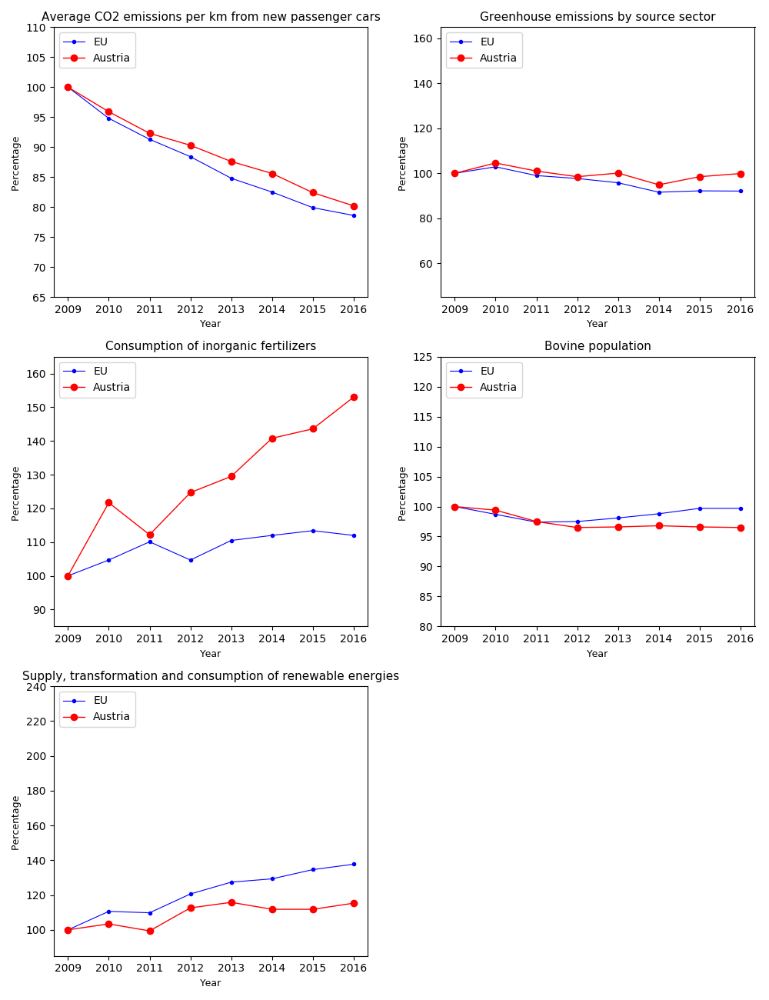

<IPython.core.display.Javascript object>


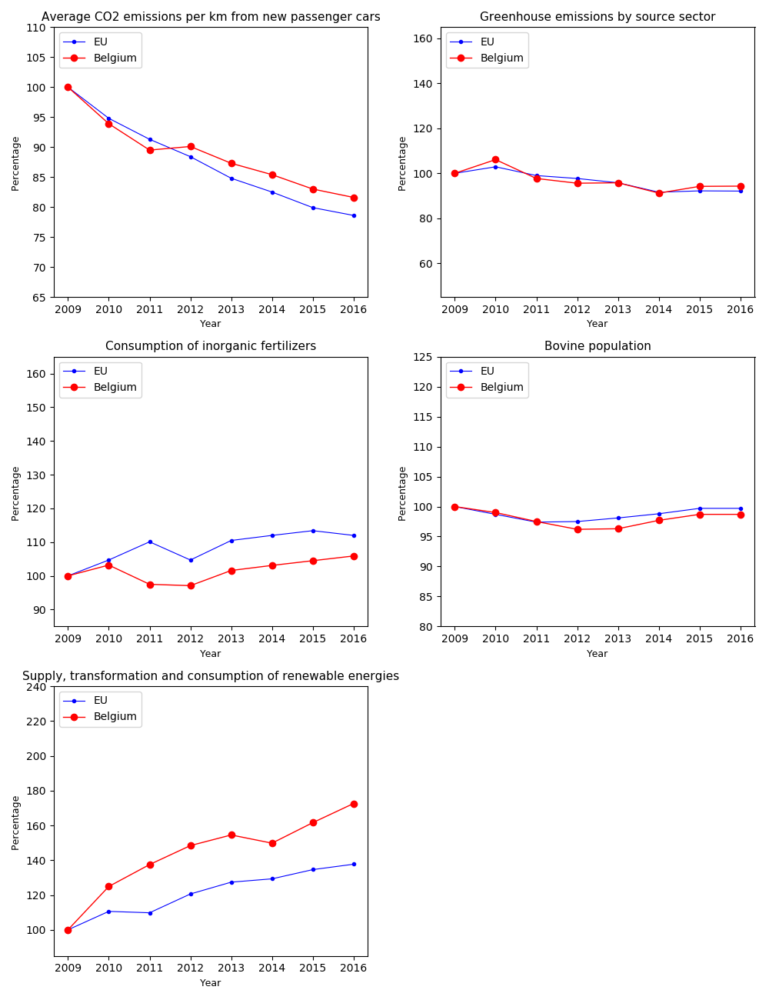

<IPython.core.display.Javascript object>


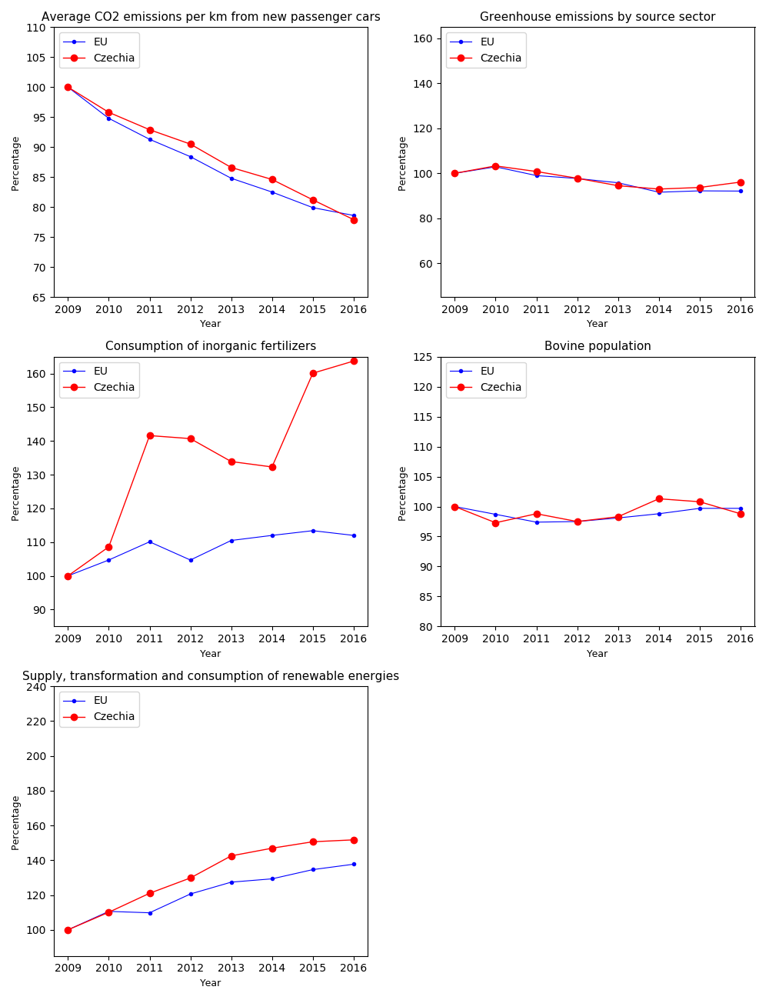

<IPython.core.display.Javascript object>


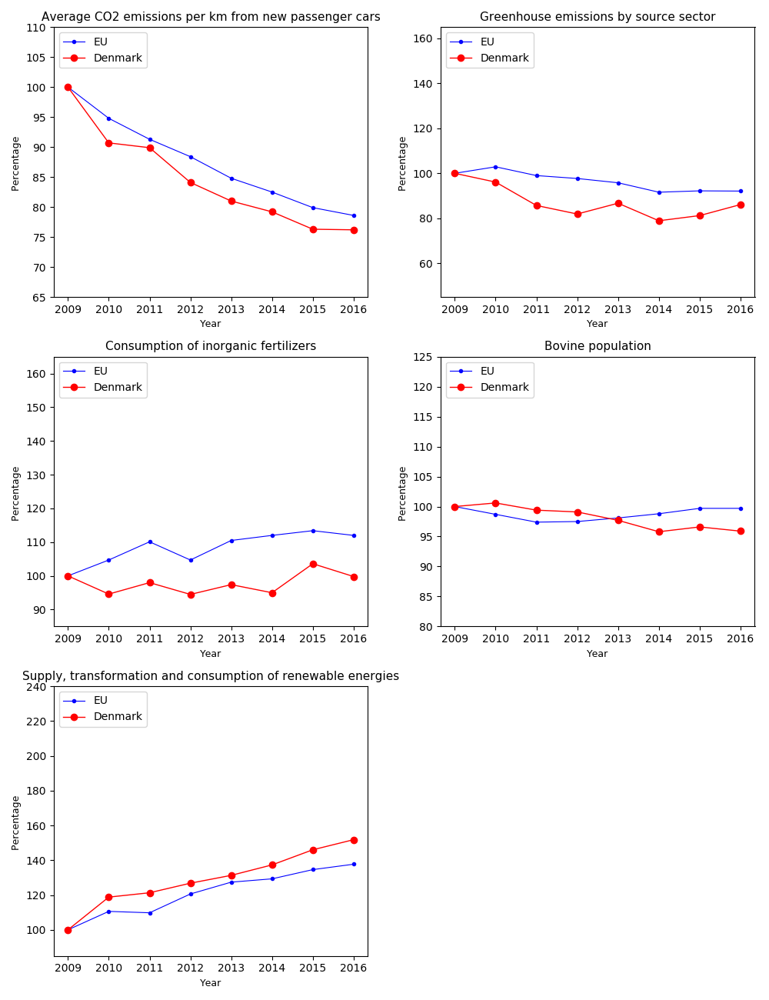

<IPython.core.display.Javascript object>


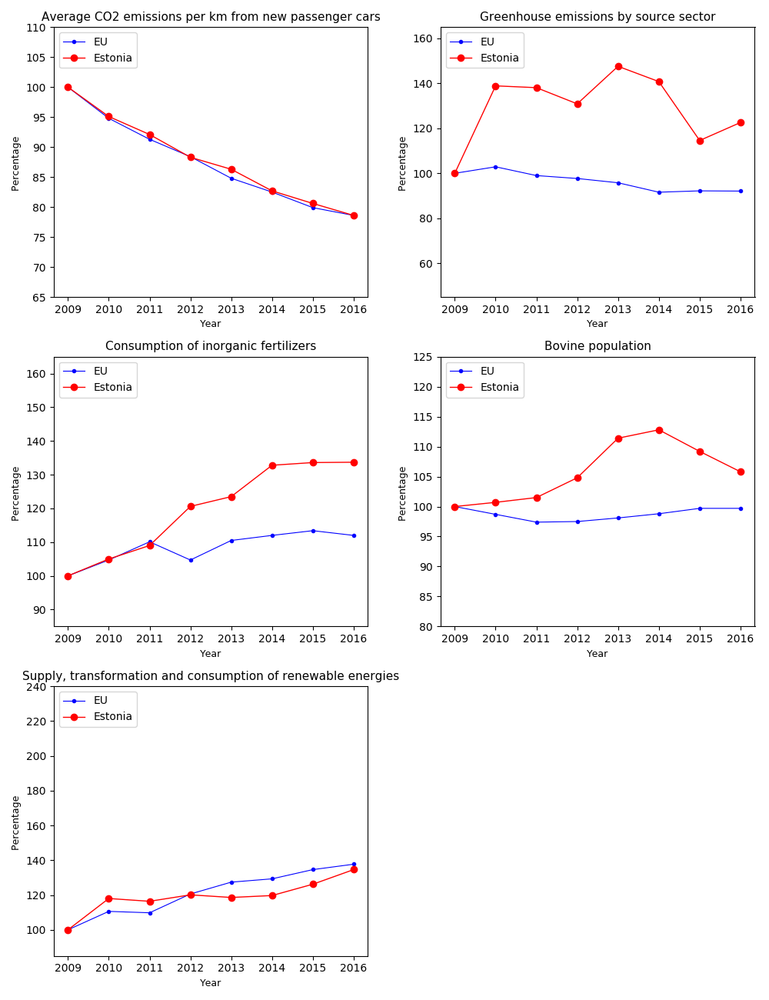

<IPython.core.display.Javascript object>


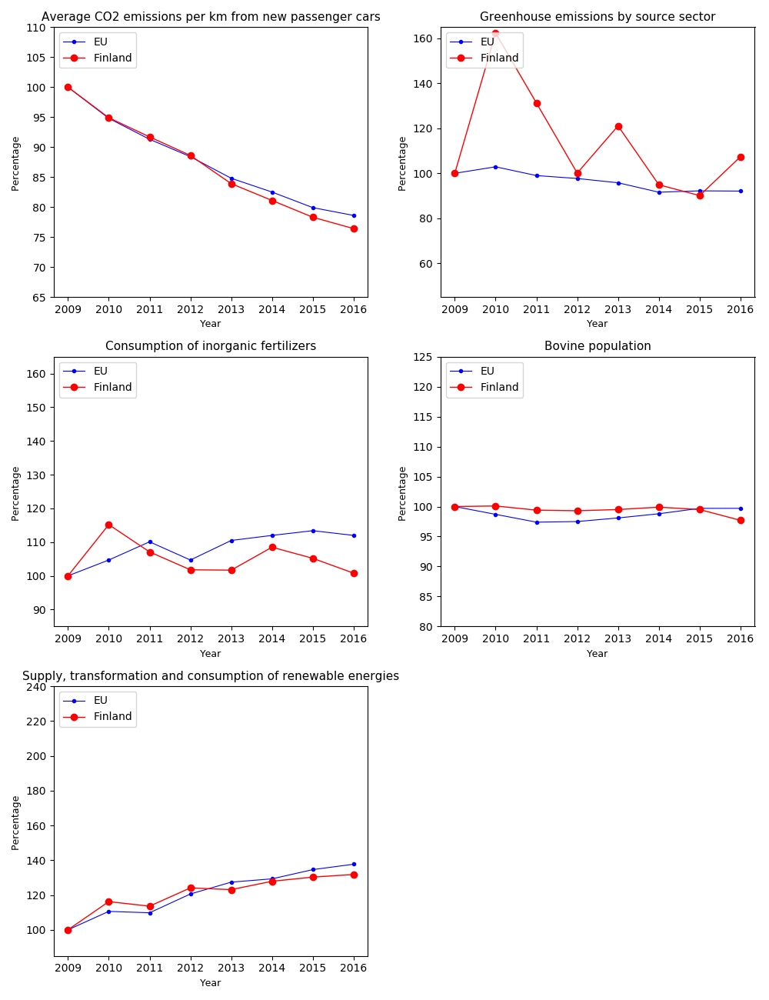

<IPython.core.display.Javascript object>


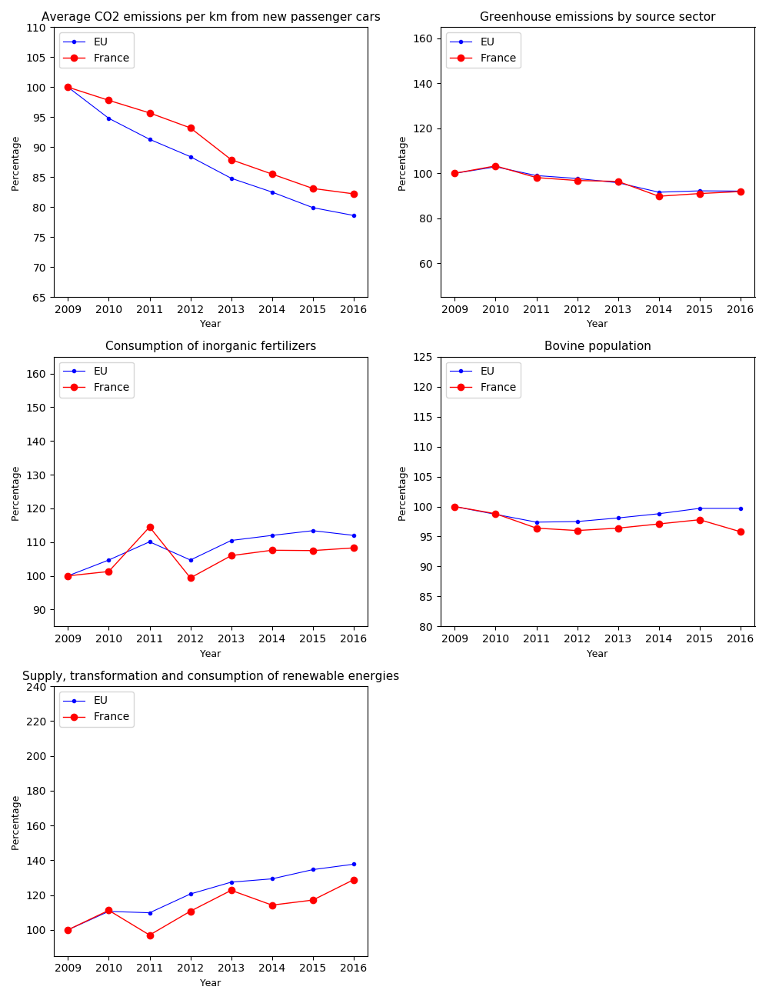

<IPython.core.display.Javascript object>


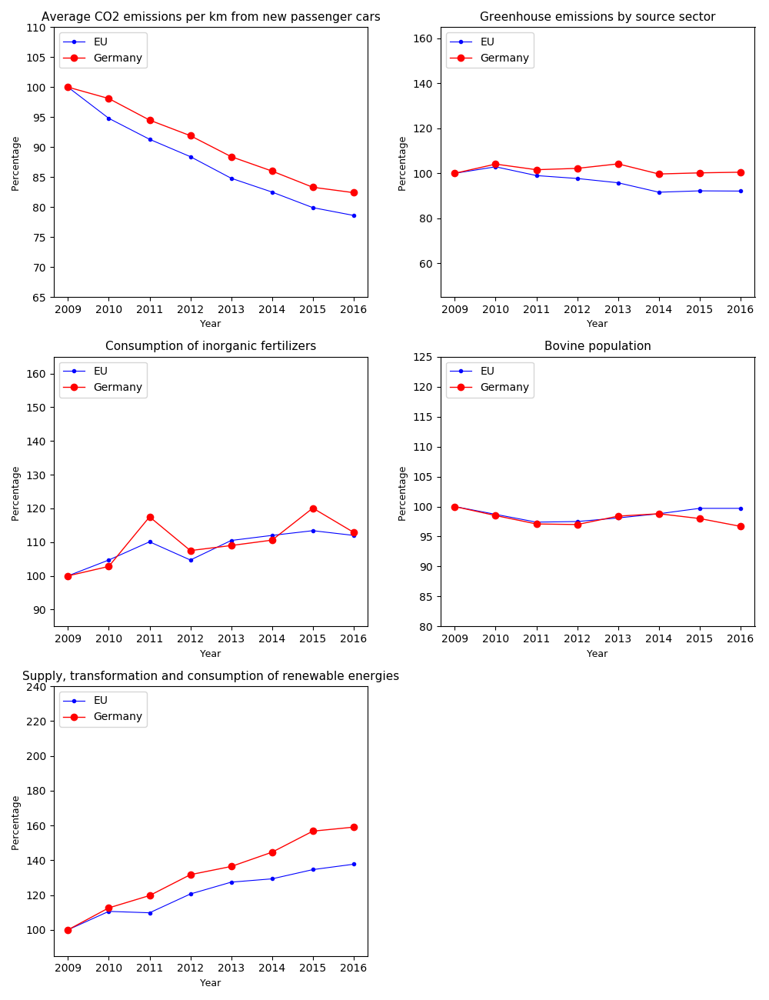

<IPython.core.display.Javascript object>


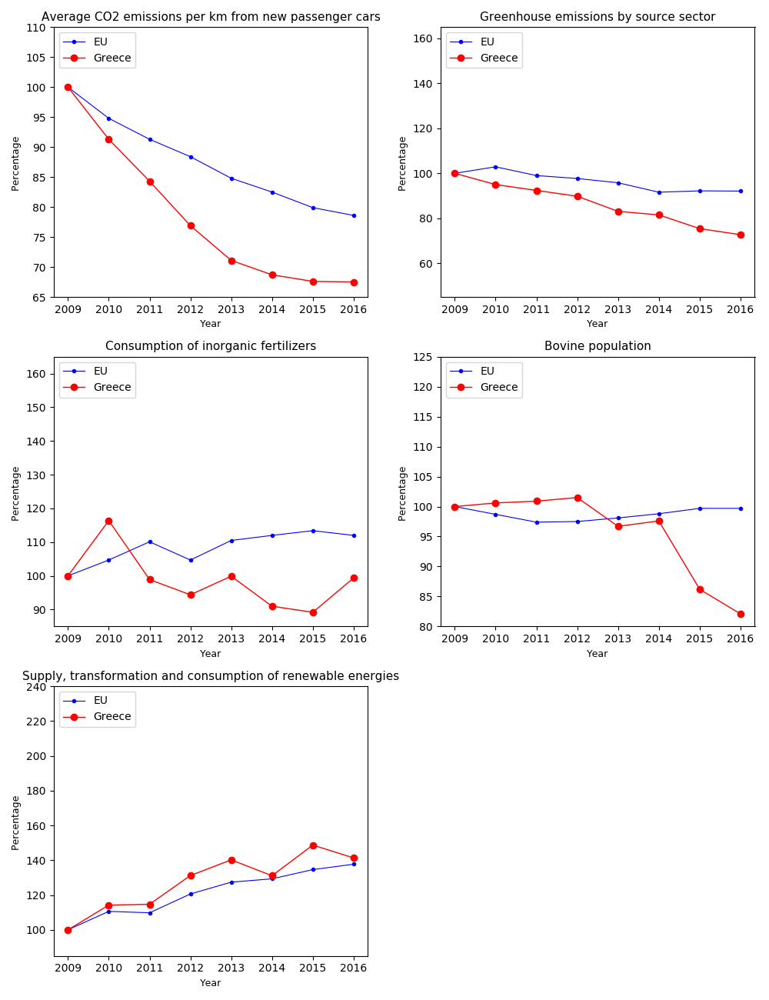

<IPython.core.display.Javascript object>


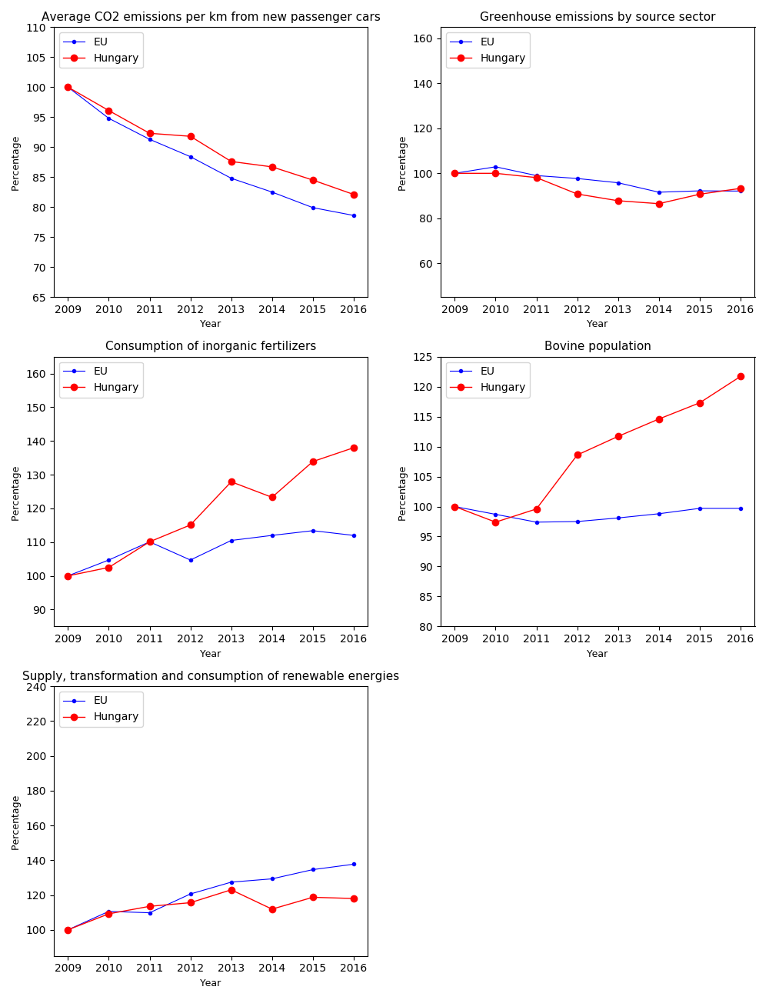

<IPython.core.display.Javascript object>


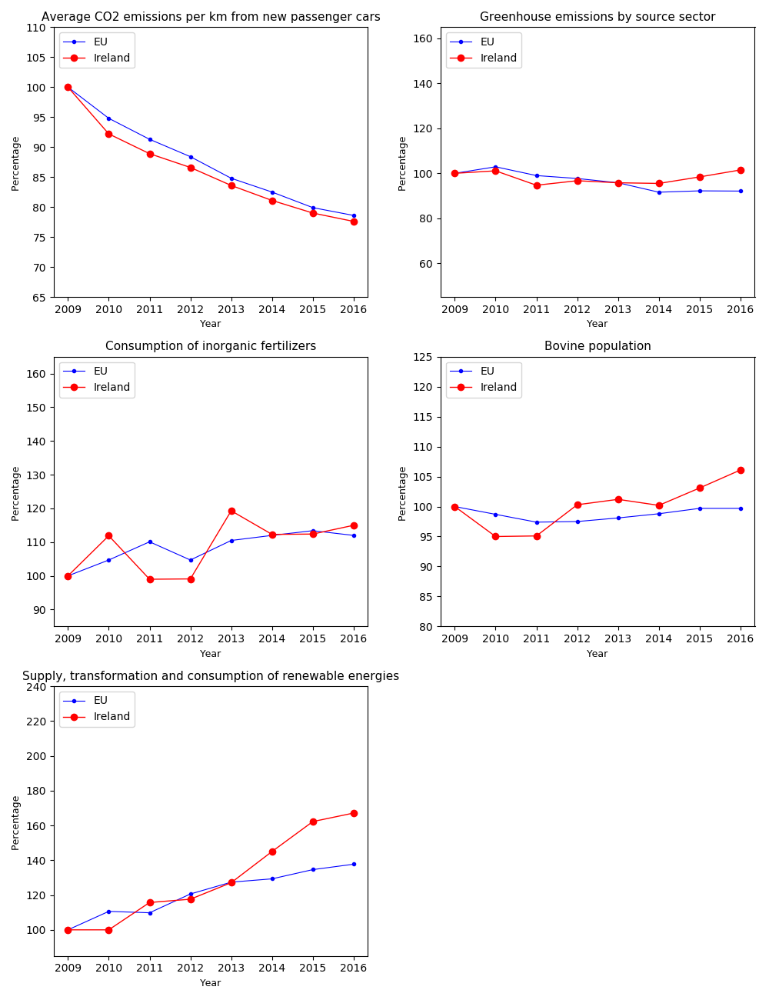

<IPython.core.display.Javascript object>


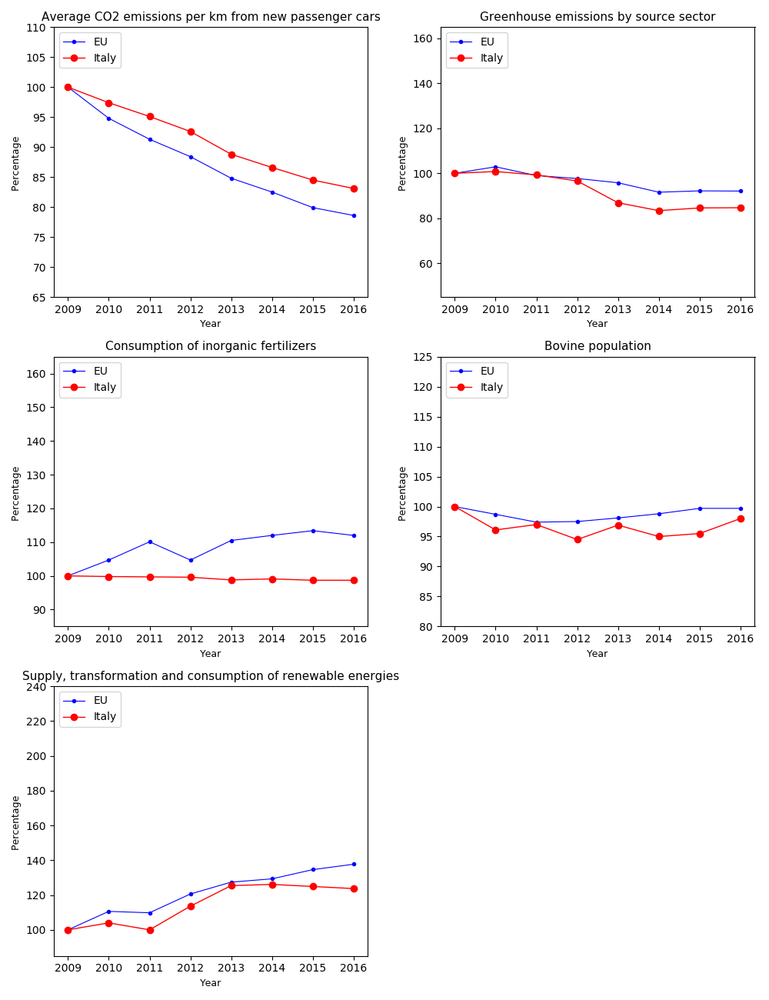

<IPython.core.display.Javascript object>


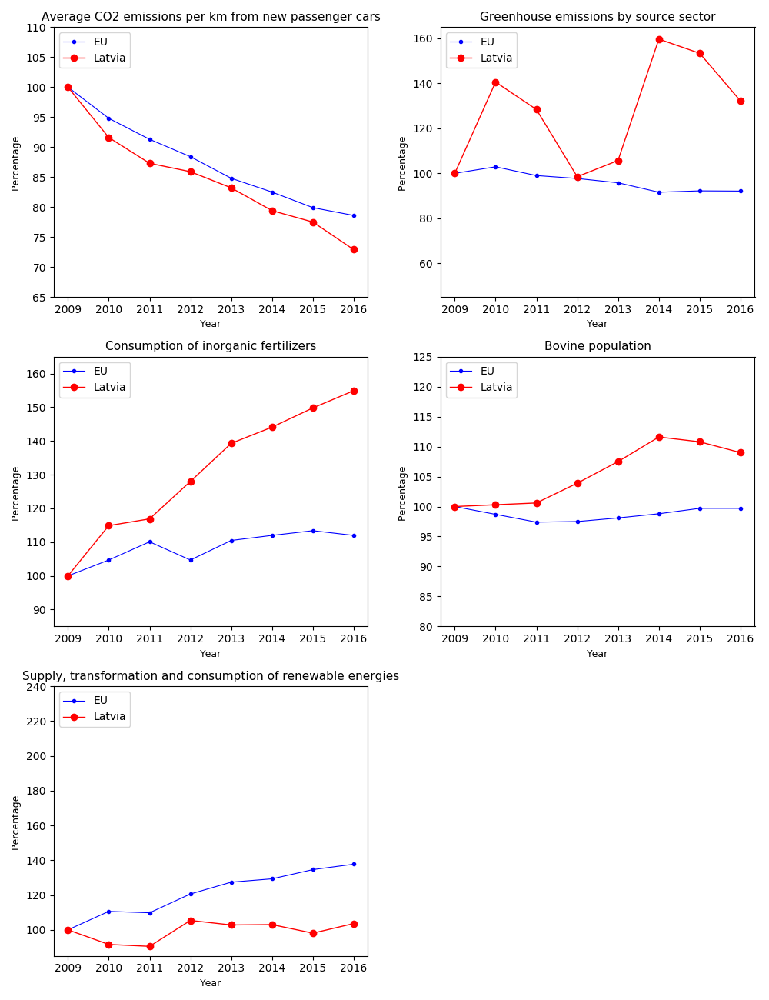

<IPython.core.display.Javascript object>


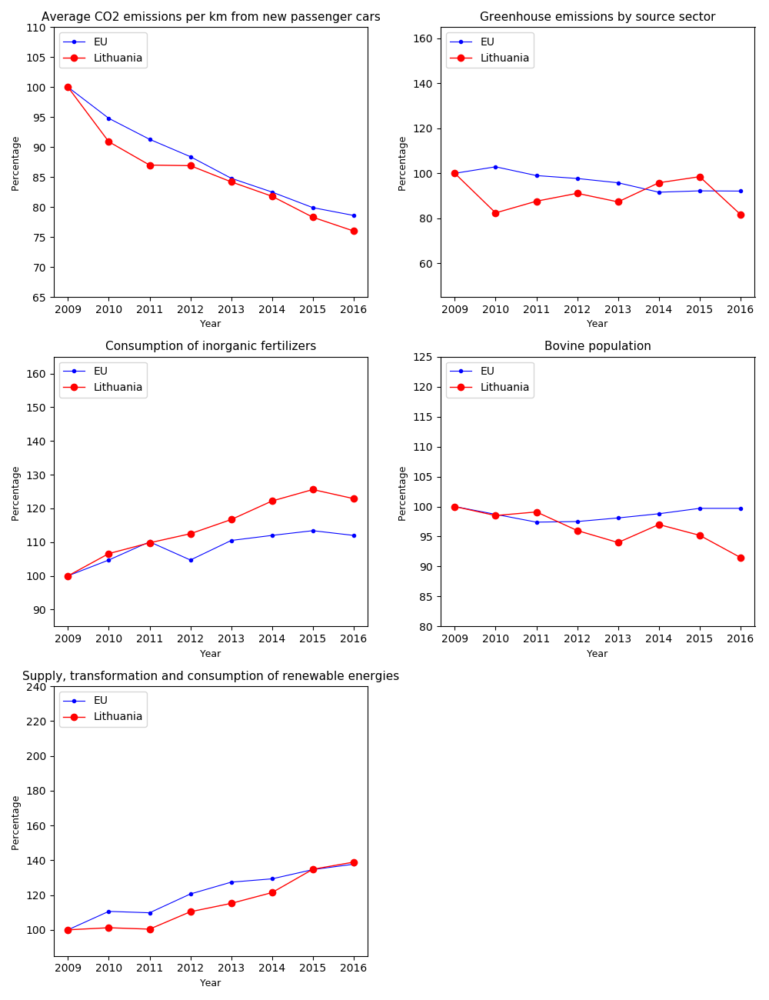

<IPython.core.display.Javascript object>


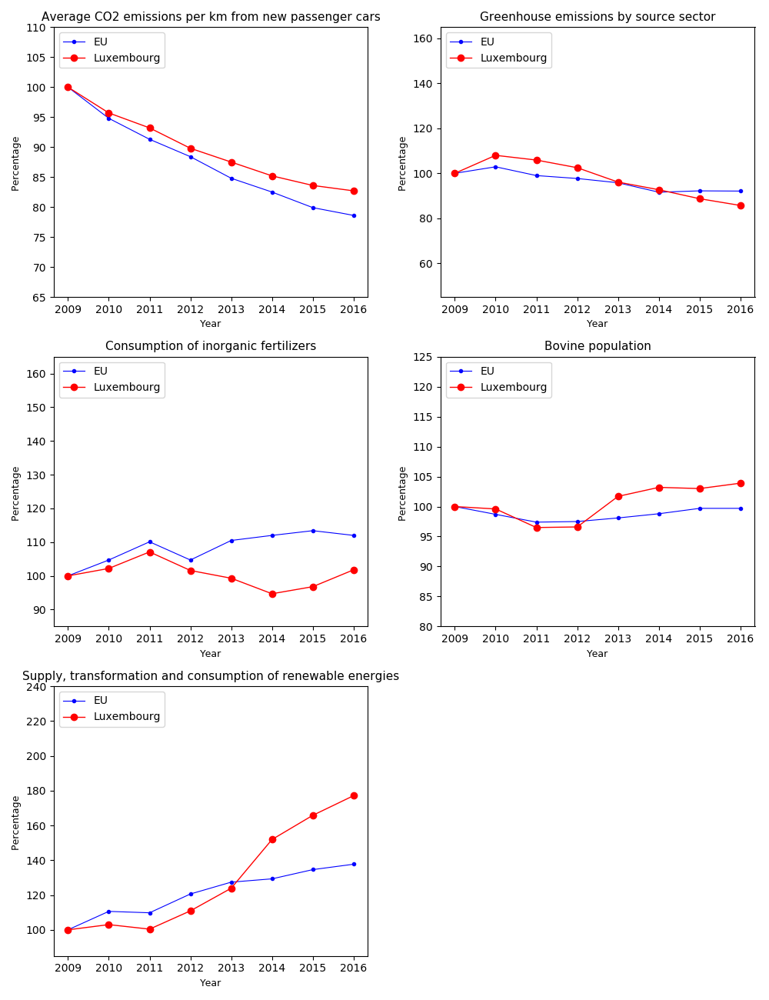

<IPython.core.display.Javascript object>


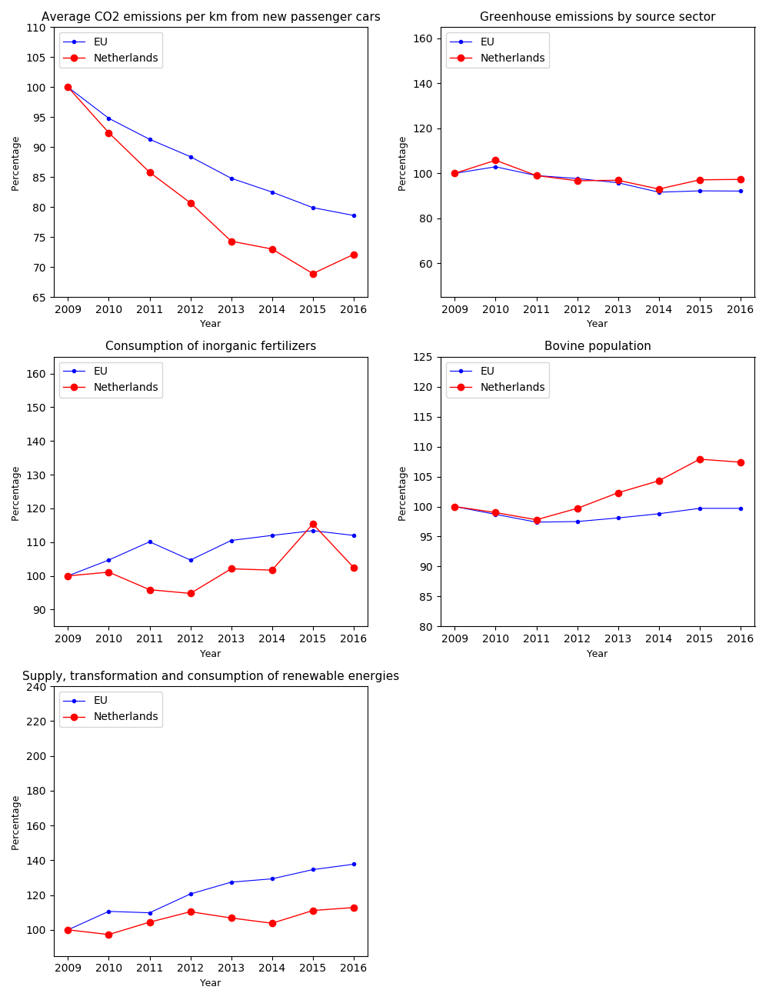

<IPython.core.display.Javascript object>


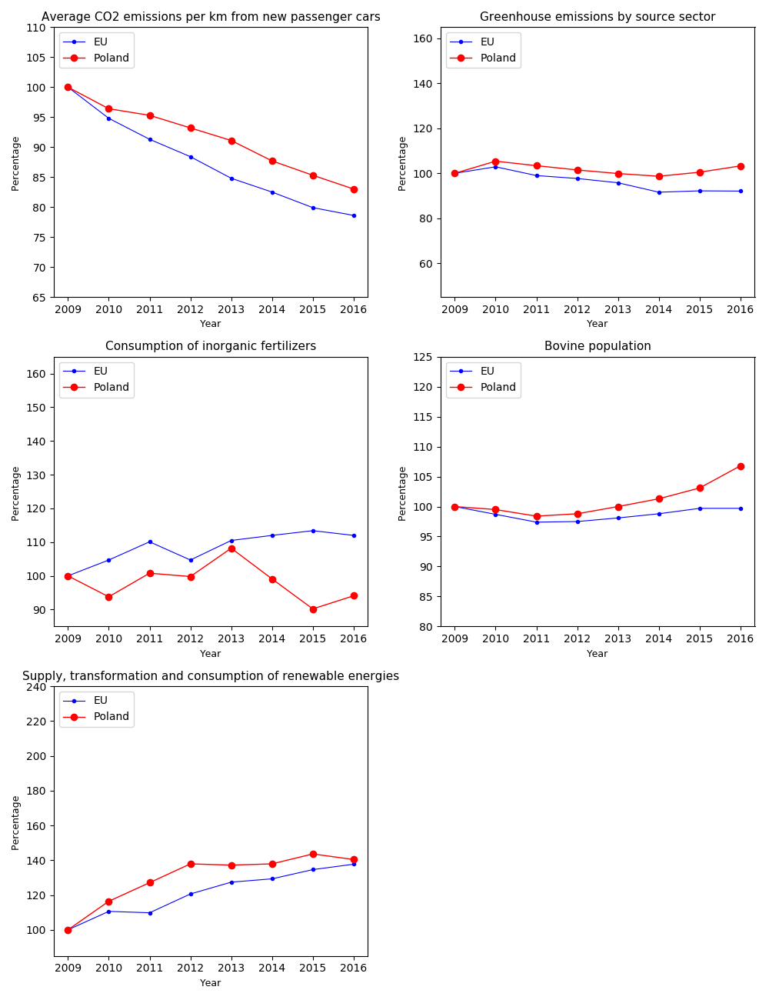

<IPython.core.display.Javascript object>


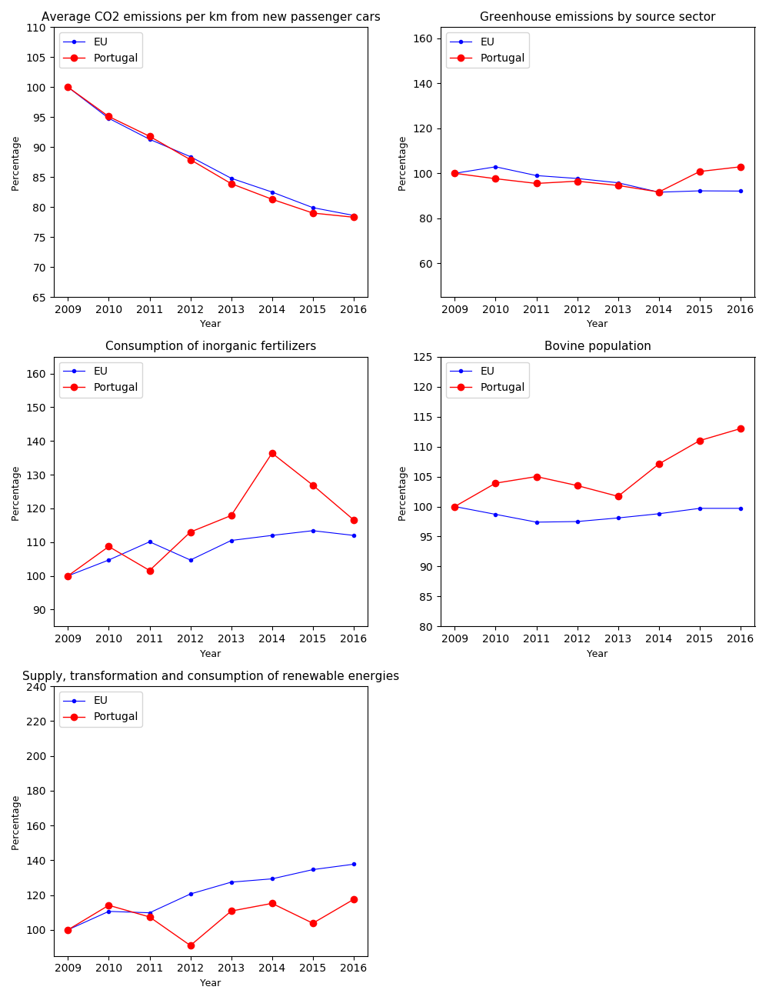

<IPython.core.display.Javascript object>


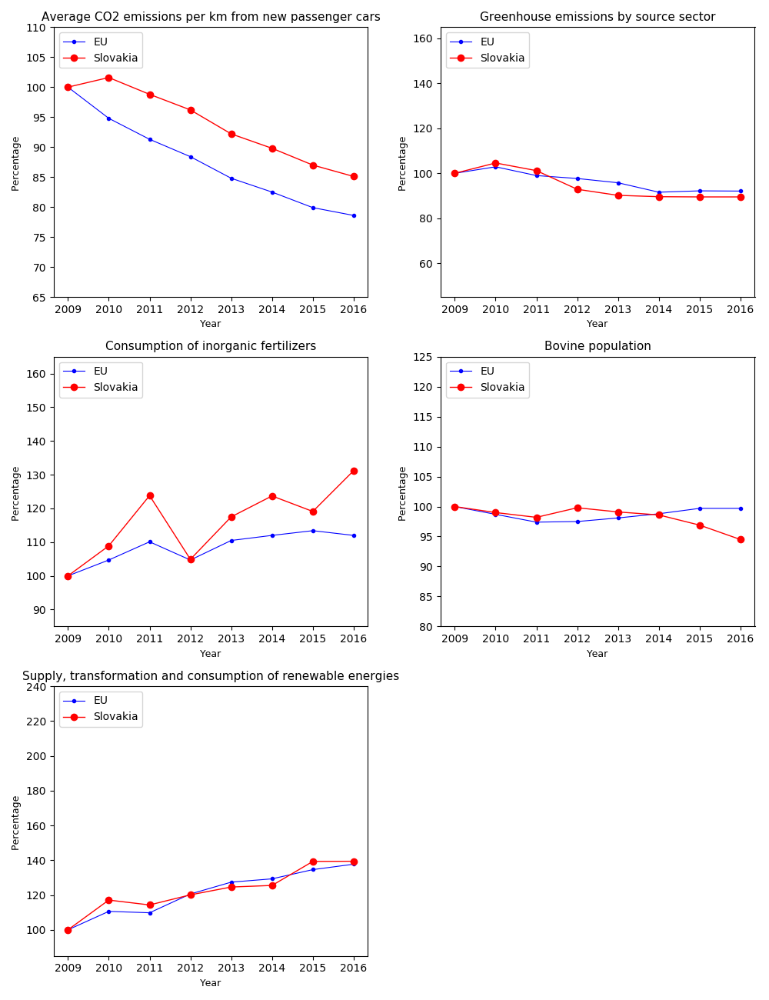

<IPython.core.display.Javascript object>


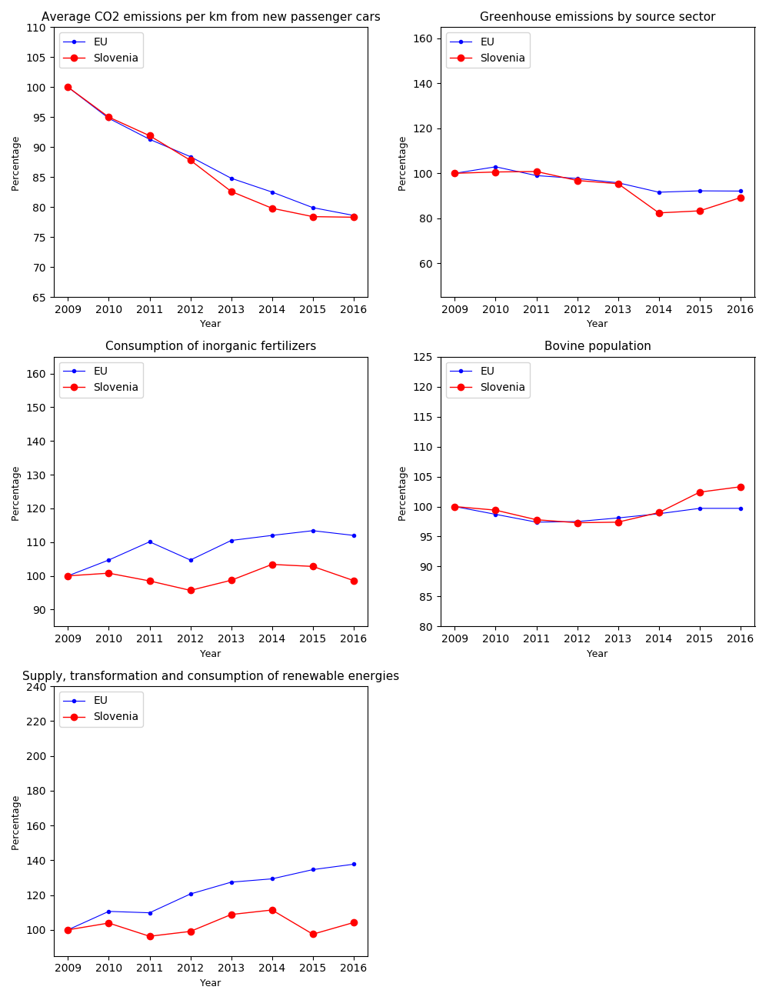

C:\Users\Mattia Brocco\Anaconda\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


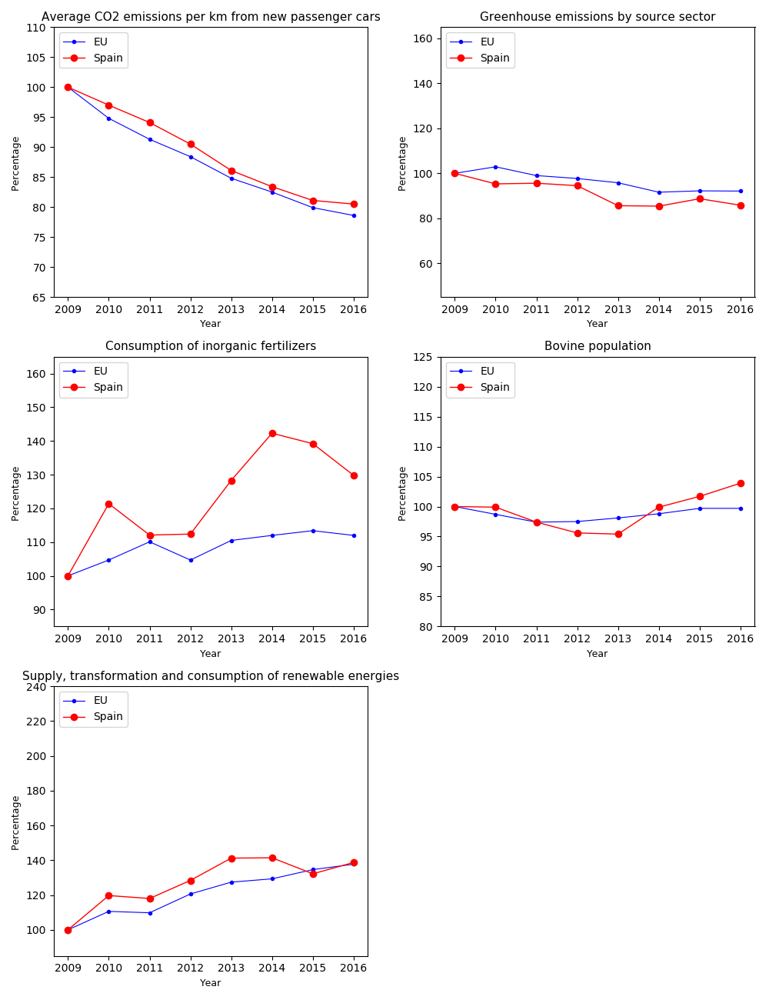

<IPython.core.display.Javascript object>


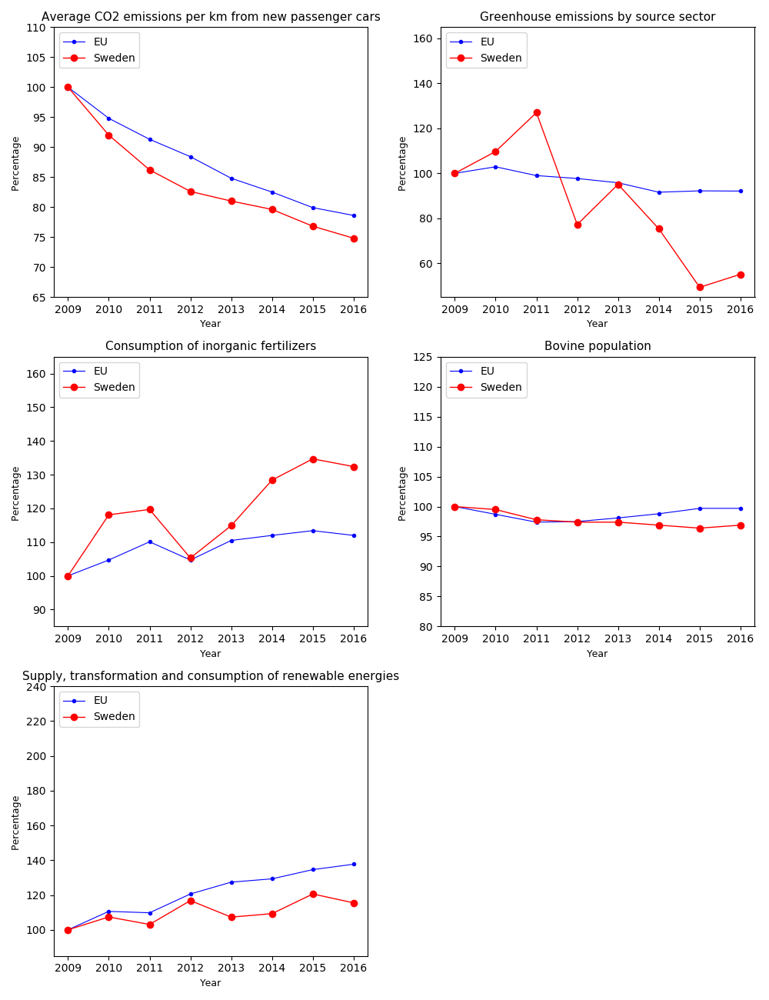

<IPython.core.display.Javascript object>


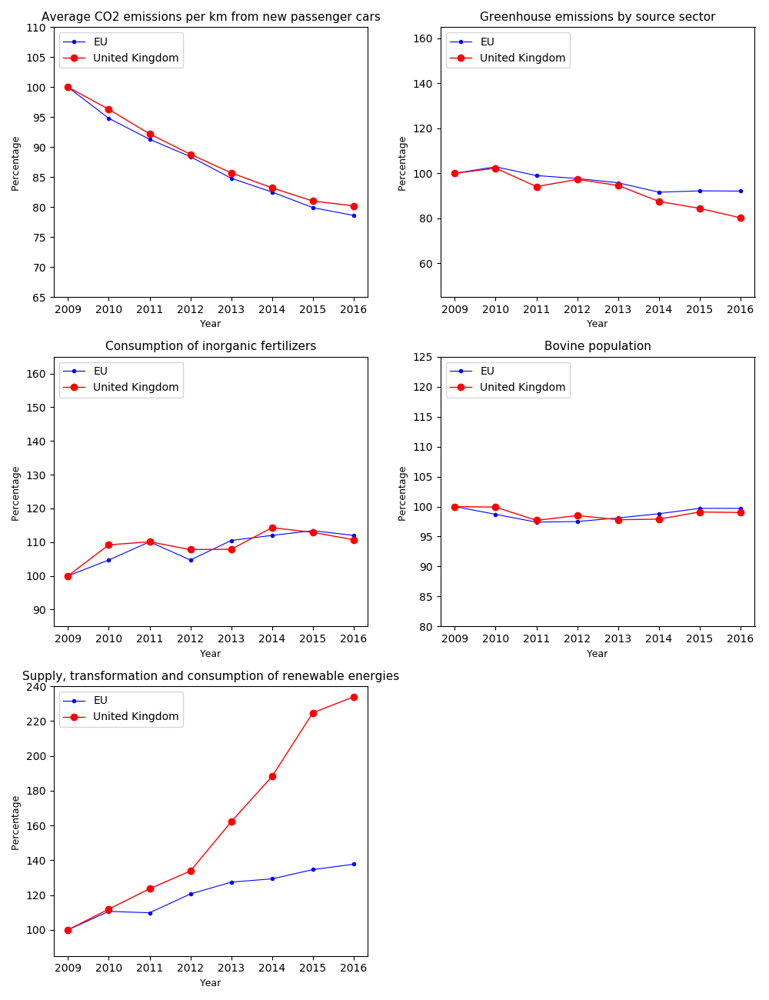

In [34]:
# from the GRAPH_class making plots and make them jpg
for k,v in countries_abb.items():
    test = pc.graph()
    test.cartesian(v[0], v[1], k, merge)

In [35]:
m = folium.Map(location=[54.160231234635866,13.540297474999988], tiles = "OpenStreetMap", zoom_start=3.5)  

for k,v in coord.items():   
    encoded=base64.b64encode(open(k+".jpg","rb").read()).decode()
    html = '<img src="data:image/jpeg;base64,{}">'.format
    iframe = folium.IFrame(html(encoded), width=632+20, height=420+20)
    popup = folium.Popup(iframe, max_width=2650) 
    marker = folium.Marker(v, popup=popup, tooltip = k).add_to(m)
    m.add_child(marker)
m.save("MarkerGraphVisualization.html")
m

With the following function `country_table`, you just need to insert the Country that you are interested in to obtain its table with all datasets values. In this way you can compare the percentage change numerically from the table, and graphically from the map above.

In [36]:
def country_table(country):
    x = gc.geo()
    table = x.table_for_country("X", merge, country.title())
    return table

country = input("Insert country: ")
country_table(country)    

Insert country: hungary


TIME,2009,2010,2011,2012,2013,2014,2015,2016
Hungary,,,,,,,,
Average CO2 emissions per km from new passenger cars,100.0,96.1,92.3,91.8,87.6,86.7,84.5,82.1
Greenhouse emissions by source sector,100.0,100.0,98.1,90.8,87.8,86.5,90.7,93.3
Consumption of inorganic fertilizers,100.0,102.5,110.1,115.1,127.9,123.3,133.9,138.0
Bovine population,100.0,97.4,99.6,108.6,111.7,114.6,117.3,121.7
"Supply, transformation and consumption of renewable energies",100.0,109.2,113.5,115.6,123.0,111.9,118.7,118.0


* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

# Conclusions

For every combination of datasets we created a merge of a couple of them, and then performed a graphical statistical analysis to find possible relations between datasets as an example is shown below.
```python
import seaborn as sns

fertgess = gess_100.merge(inorganic_fert_100, how='outer', on = gess_100.index.values, suffixes=('_gess', '_fert'))
fertgess.set_index("key_0", inplace=True)

sns.relplot(x="2010_gess", y="2010_fert", data=fertgess)
sns.relplot(x="2011_gess", y="2011_fert", data=fertgess)
sns.relplot(x="2012_gess", y="2012_fert", data=fertgess)
sns.relplot(x="2013_gess", y="2013_fert", data=fertgess)
sns.relplot(x="2014_gess", y="2014_fert", data=fertgess)
sns.relplot(x="2015_gess", y="2015_fert", data=fertgess)
sns.relplot(x="2016_gess", y="2016_fert", data=fertgess)
```

Nevertheless, the result is that none of the year examined was characterized by a relation of two dataset. This means that, even if for sure something by each country has been done, there has never been an evident environmental policy involving more than one pollutant-production sector.

### Brief conclusion of the trends for each country:

**AUSTRIA:** Generally, we cannot consider Austria as one of the countries that more contributed in reducing pollution over this range of time. Indeed, looking at the plots from the map above, we can notice how Austria is below the European percentage mean only for bovine population and for renewables energies use, which means that, except for decreasing the number of livestocks, it did not keep pace with the mean of EU countries, even if Austria decreased cars emissions. Moreover we notice that Austria is very above the average for the consumption of inorganic fertilizers.

**BELGIUM:** Belgium is very close to the European mean in almost all datasets. It decreased the consumption of inorganic fertilizers more than the EU countries in average did, vice versa for the average CO2 emissions per km from new passenger cars. Furthermore, for what concerns the development of renewable energies, Belgium is one of the best countries, with an increase of 72.6% since 2009.

**CZECHIA:** Except for the great growth of its usage of inorganic fertilizers, also Czechia is very close to EU mean. Czechia also developed more than average the supply, transformation and consumption of renewable energies.

**DENMARK:** In 2016, all the pollutants of Denmark have seen a higher decrease than the ones of the European mean, and it also developed more its "green economy". The only period that Denmark did worse is between 2009 and 2012 for its bovine population, then it decreased it as well.

**ESTONIA:** As we saw during the whole research, Estonia is one of countries in Europe that have not decreased its pollutants. Moreover, Estonia did not achieve to lower the emissions for new passenger cars below the 130 g threshold of CO2/km even if its degrowth rate is almost similar to the european mean. 

**FINLAND:** The greenhouse gas emissions from industry of Finland had seen a vacillating course during these 8 years, most of the time above the growth rate of Europe. Although Finland decreased much the consumption of inorganic fertilizers, for the other pollutants and for the renewable energies, it had a coherent trend to the one of Europe.

**FRANCE:** In terms of absolute values France is one of the most polluting countries and one of those that mostly used renewable energies. However, the change in percentage is almost similar to the european one, except for cars emissions and renewable energies that is worse, even if for absolute values is one of the best states for both datasets.

**GERMANY:** Like France, Germany is one of the most polluting countries but in this case we have not good signals since the growth rate of Germany is better (in terms of "quality") only for the bovine population and the supply, transformation and consumption of renewable energies if compared with the average in Europe. 

**GREECE:** In terms of percentage change, Greece is one of the countries that most have decreased all its pollutants. However, probably we have to take in account the crisis that Greece suffered in the last years.

**HUNGARY:** Except for greenhouse gasses emissions, Hungary's trend of pollutants is above the european mean. Furthermore, its percentage increase in bovine population and consumption of inorganic fertilizers is very high with respect to the rest of the countries. However, in terms of absolute values Hungary has not a great impact if compared to other countries. 

**IRELAND:** For the consumption of inorganic fertilizers and the bovine population, Ireland has a vacillating course, then the other factors have a similar change of european ones. For the supply, transformation and consumption of renewable energies change, at first was very close to Europe, then starting from 2014 it increased more.

**LATVIA:** Like Estonia, Latvia is one of the countries in Europe that had not a significant decrease in its pollutants. Indeed, all of them increased considerably, except for cars emissions, the only field in which Latvia did better than the mean of Europe. However, Latvia did not achieve to lower the emissions for new passenger cars below the 130 g threshold of CO2/km. Furthermore, Latvia increase the use of renewable energies only by 3.6%.

**LITHUANIA:** The only field in which Lithuania increased more than Europe is in the consumption of inorganic fertilizers. Its "performance" has not been so constant over years, however, in 2016 Lithuania did better than Europe. Before 2015, Lithuania was below the mean of Europe for the development of renewables energies but at the end it succeeded in keeping pace with it.

**LUXEMBOURG:** Luxembourg had a vacillating course. In 2013 it succeded in decreasing emissions of greenhouse gasses and also increased the development of renewables energies, reaching the mean of EU. However, in the same year Luxembourg started increasing the bovine population too. For what concerns cars emissions, Luxembourg did not decrease too much them even if it achieve to lower the emissions for new passenger cars below the 130 g threshold of CO2/km. In spite of the vacillating course, for the increase of the use of renewable energies Luxembourg is second only to UK.

**NETHERLANDS:** Only the bovine population of Netherlands is above the mean of the European Union, all the other pollutants are below or similar - only the greenhouse gas emissions - to it. Also for renewable energies, Netherlands developed them less than the average (+12.8%).

**POLAND:** As we saw during the analysis, Poland is one of the countries that most polluted during this period in terms of absolute values. Poland decreased more than the average only the consumption of inorganic fertilizers. However, it employed more than the mean the usage of renewables energies, except for 2016 where the overall increase since 2009 of Poland was the same of the average. Always in 2016 Poland increased even more the bovine population.

**PORTUGAL:** Except for car emissions, the usage course of Pollutants and Renewable energies of Portugal is always sinuous. Most of the years it achieved a worse result respect to the average.

**SLOVAKIA:** Except for car emissions and the consumption of renewable energies, Slovakia had a very similar course to the average. Moreover, from 2014 it started decreasing more and more the bovine population. 

**SLOVENIA:** For what concerns Slovenia, it is below the european average only for the consumption of inorgnanic fertilizers, but also for the development of renewable energies: indeed, Slovenia did not increased so much that field, only by 4,2%, being one of the worst countries. In the last few years, Slovenia decreased also the greenhouse gas emissions while increasing the bovine population.

**SPAIN:** Spain had a vacillating course for almost all analyzed features, except for car emissions and greenhouse gas emissions. Indeed, considering the total percentage change since 2009 to 2016, only the greenhouse gas emissions are below the european mean. Even if before 2015 the supply, transformation and consumption of renewable energies of Spain was above the average, in the last 2 years it decreased to the level of Europe.

**SWEDEN:** Although the vacillating course, in 2016 Sweden succeded in decreasing the greenhouse gas emissions by almost 50%! Also the other pollutants are below the average, except for the consumption of inorganic fertilizers. For the development of renewable energies Sweden did not a remarkable job with respect to the average.

**UNITED KINGDOM:** Even if in terms of absolute values United Kingdom is not the best, this is the country that most of all increased the supply, transformation and consumption of renewable energies: +133.9%. The percentage change of all pollutants is very similar to the average of EU.

### Italy

In [37]:
# code in the class
it = gc.geo()
it.table_for_country("IT", merge, "Italy")

TIME,2009,2010,2011,2012,2013,2014,2015,2016
Italy,,,,,,,,
Average CO2 emissions per km from new passenger cars,100.0,97.4,95.1,92.6,88.8,86.6,84.5,83.1
Greenhouse emissions by source sector,100.0,100.8,99.3,96.6,86.9,83.4,84.6,84.7
Consumption of inorganic fertilizers,100.0,99.8,99.7,99.6,98.8,99.1,98.7,98.7
Bovine population,100.0,96.1,97.0,94.5,96.9,95.0,95.5,98.0
"Supply, transformation and consumption of renewable energies",100.0,104.0,100.0,113.6,125.4,126.1,124.9,123.7


<IPython.core.display.Javascript object>


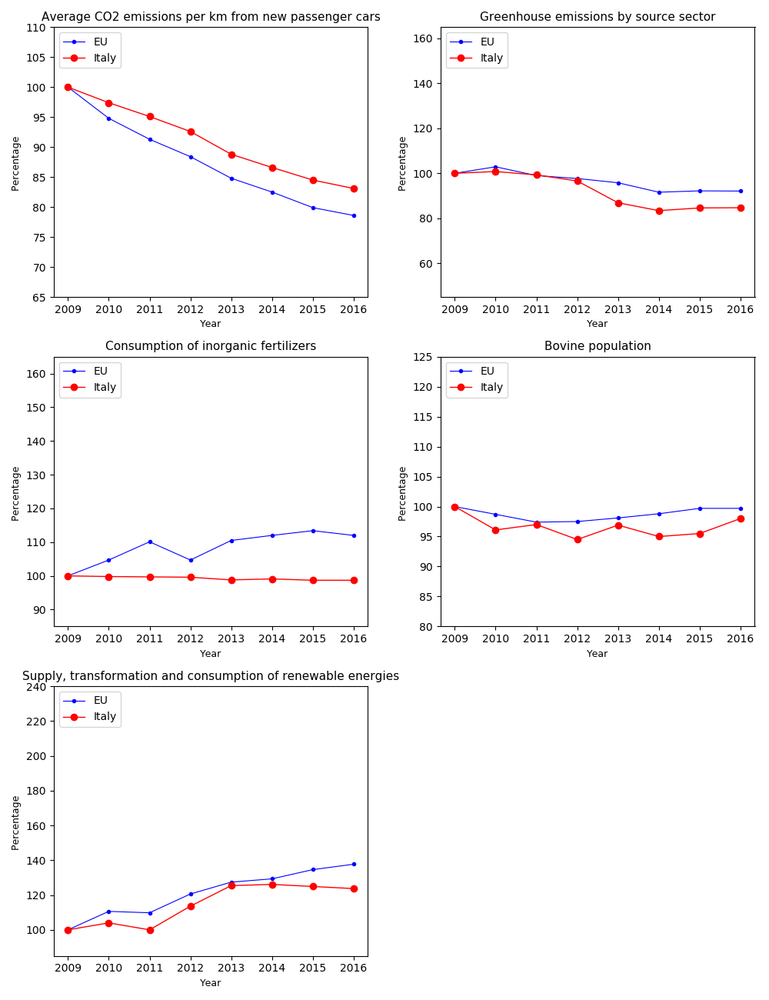

In [38]:
# trend plot of Italy
italy = pc.graph()
italy.cartesian("it", "IT", "Italy", merge)

#### Brief comment: 

We can see how Italy succeeded in reducing all the pollutants while increasing the *supply, transformation and consumption or renewable energies* by 23.7%.

Even if it is true that the consumption of inorganic fertilizers and the bovine population did not decrease a lot, we have to consider that Italy did a better job anyway if compared with the mean of the area analyzed in this reasearch, as it did for all the remaining sectors excluding the car emissions and the development of renewable energies. 

However, for what concerns the renewable energy use, while it is true that compared to the EU, Italy did not keep pace with the mean, we have to take into account that, how we saw before, in terms of absolute values Italy is second only to Germany.

### European Union

In [39]:
# code in the class
eu = gc.geo()
eu.table_for_country("EU", merge, "EU (23 Countries)")

TIME,2009,2010,2011,2012,2013,2014,2015,2016
EU (23 Countries),,,,,,,,
Average CO2 emissions per km from new passenger cars,100.0,94.8,91.3,88.4,84.8,82.5,79.9,78.6
Greenhouse emissions by source sector,100.0,102.9,99.0,97.7,95.8,91.6,92.2,92.1
Consumption of inorganic fertilizers,100.0,104.7,110.1,104.7,110.5,112.0,113.4,112.0
Bovine population,100.0,98.7,97.4,97.5,98.1,98.8,99.7,99.7
"Supply, transformation and consumption of renewable energies",100.0,110.6,109.8,120.6,127.4,129.3,134.6,137.7


#### Brief comment: 

This table represents and summarize the general data change of all our datasets for the whole area analyzed. 

It is hence remarkable the great job that has been done reducing the *Average CO2 emissions per km from new passenger cars* (-21.4%) and for the *Supply, transformation and consumption of renewable energies*, which in general denotes a huge effort in this sector (considering also that the GHG emissions from industry are slightly decreasing).
However, the *Consumption of inorganic fertilizers* has increased by 12% since 2009, and as a matter of fact this is the only feature which result is negative due to basically absence of regulation (the situation is definitely going to improve with the new regulation)

- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

## Results overview


By comparing our results with the EU Climate Action, we noticed that only a few Countries did not manage to reduce below the mandatory threshold the emissions for new passenger cars, and those are Estonia and Latvia. A wider analysis led us to conclude that all examined Countries from 2009 have begun a positive trend of year-by-year reduction (except for Netherlands).

An important pollution cause is related to the secondary sector, that includes all types of industrial production. From the data we understood which Countries had the highest values in this index (from the first: Germany, United Kingdom, France, Italy and Poland), but we need to take into account that these Countries are also the driving States of European production. The most important result, nevertheless, is how each Country has been able to reduce the emissions coming from the industrial production: out of the five States mentioned above, four reduced this parameters in the eight-years time interval. Remarkable results then come from UK, Italy, Sweden and Greece, and this belies the assumption that only Northern Europe Countries put effort against pollution.

Since  the Regulation (EC) No 2003/2003 does not define a permitted quantity, we looked at the use of inorganic fertilizer in European States because it is considered one of the correlated causes of the worldwide pollution. Due to the low juridical restriction, only a few Countries reduced the consumption, choosing better profits in terms of crops without investing in R&D to develop less-polluting manures and fertilizers. The absence of regulation enabled Spain to increase the consumption of inorganic fertilizers of almost 30%. Due to differences in territorial extension and productive footprint there are a few “leading” countries with a huge gap with all others.
However, in 2016 a European Act has been approved, the COM/2016/0157 final - 2016/084 (COD), to reduce the quantity of inorganic elements in the composition of fertilizers, in particular there must not be more than 15,75% of nitrogen and 5% of phosphorus.

A non-neglectable cause of pollution through the emission of greenhouse gasses comes from livestock, and especially bovines. From the above computation, it is remarkable to notice that every single cattle emits about 450 tons per year of greenhouse gasses. From the data concerning the number of bovine livestock per each Country, we noticed that there is a redundancy of the most polluting States: we underline that the top of this “blacklist” is composed of France, Germany, United Kingdom, Ireland, Spain, Italy and Poland: these Countries hold the 77% of the overall European bovine population. With an extended analysis we gathered that for most of States the percentage variation is close to zero, while Portugal and Hungary increased this index up to round 15%, while Greece decreased it by 18%. FAO (Food and Agriculture Organization of UN) suggested possible solutions without reducing too much the number of livestock (since many underdeveloped Countries still heavily rely on Primary sector): Countries should use waste coming from the food industry as livestock feed, thanks to adequate policies and certification systems, or implementing grazing and synchronize it with fertilization and nutrient management to increase the quality of pastures and soil, or reduce the impact on the environment of cattle with the implementation of biogas conversion plants.

- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -